In [5]:
import torch.utils.data as data
from os import listdir
from os.path import join
from PIL import Image
import torchvision.transforms as transforms
import torch
import numpy as np
import random
import torchvision.transforms.functional as TF
import math
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from skimage import io
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
from torch.nn import init
from torch.optim import lr_scheduler


from torch.utils.data import DataLoader,Dataset
import torch.optim as optim

import glob
import os
import pickle
from tqdm import tqdm
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, auc, roc_curve

def imageJ_autocontrast(img):
    out = np.zeros_like(img)
    pixelCount = img.size
    limit = pixelCount/10
    histogram = cv2.calcHist([img],[0],None,[256],[0,256])
    autoThreshold = 5000
    threshold = pixelCount/autoThreshold
    i = -1;
    found = False
    while(~found & (i<255)):
        i+=1
        count = histogram[i]
        if count>limit:
            count=0
        found = count>threshold
    hmin = i
    i = 256
    found = False
    while (~found & (i>0)):
        i-=1
        count = histogram[i]
        if count>limit:
            count=0
        found = count>threshold
    hmax = i
    if (hmax>=hmin):
        new_min = hmin
        new_max = hmax
        if (new_min==new_max):
            new_min=np.min(img)
            new_max=np.max(img)
    else:
        new_min = 0
        new_max = 255
        
    for i in range(img.shape[0]):
        for j in range(img.shape[1]): 
            if 255*(img[i][j]-new_min)/(new_max-new_min) >255:
                out[i][j]=255
            elif 255*(img[i][j]-new_min)/(new_max-new_min) < 0:
                out[i][j]=0
            else:
                out[i][j] = 255*(img[i][j]-new_min)/(new_max-new_min)

    return out

In [6]:
from prettytable import PrettyTable

def count_parameters(model):
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad: continue
        param = parameter.numel()
        table.add_row([name, param])
        total_params+=param
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params

import timeit

In [88]:
#Dataset

class DatasetFromFolder(data.Dataset):
    def __init__(self, root_path, folder_path, phase='train'):
        super(DatasetFromFolder, self).__init__()
        self.root_path = root_path
        self.folder_path = folder_path
        self.phase = phase
        self.patch_size = 64

    def __getitem__(self, index):
        folder_name = self.folder_path[index]
        image_path = self.root_path + folder_name + "/"
        slices_path = image_path + "slices_contrasted//" 
        slices_name = listdir(slices_path)
        slices_number = []
        for i in range(slices_name.__len__()):
            slices_number.append(int(slices_name[i][0:-4]))
        slices_number = np.asarray(slices_number)
        sorted_idx = np.argsort(slices_number)
        slices_name_sorted = []
        for i in range(slices_name.__len__()):
            slices_name_sorted.append(slices_name[sorted_idx[i]])
        try:
            output_img = io.imread(glob.glob(join(image_path, '*binar*'))[0],as_gray=True)
        except:
            print(image_path)
            print(folder_name)
            

        if self.phase == 'train':
            self.transform_operator_input = transforms.Compose([
                transforms.ToTensor(),
                transforms.RandomHorizontalFlip(),
                transforms.RandomVerticalFlip(),
                transforms.RandomAffine(degrees=0, translate=(0.3, 0.1), scale=[1, 2]),
                transforms.RandomCrop(size=(self.patch_size, self.patch_size)),
#                 transforms.ToTensor(),
            ])
            self.transform_operator_output = transforms.Compose([
                transforms.ToTensor(),
                transforms.RandomHorizontalFlip(),
                transforms.RandomVerticalFlip(),
                transforms.RandomAffine(degrees=0, translate=(0.3, 0.1), scale=[1, 2], fillcolor=255),
                transforms.RandomCrop(size=(self.patch_size, self.patch_size)),
#                 transforms.ToTensor(),
            ])
        else:
            self.transform_operator_input = transforms.Compose([
                transforms.ToTensor(),
                transforms.RandomCrop(size=(self.patch_size, self.patch_size)),
#                 transforms.ToTensor(),
            ])
            self.transform_operator_output = transforms.Compose([
                transforms.ToTensor(),
                transforms.RandomCrop(size=(self.patch_size, self.patch_size)),
#                 transforms.ToTensor(),
            ])

        seed = random.randint(0, 2147483647)
        random.seed(seed)
        torch.manual_seed(seed)
        output_img = self.transform_operator_output(output_img)

        input_img = io.imread(join(slices_path, slices_name_sorted[0]),as_gray=True)
        random.seed(seed)
        torch.manual_seed(seed)
        input_img = self.transform_operator_output(input_img)

        for i in range(1, slices_name_sorted.__len__()):
            input_img_single = io.imread(join(slices_path, slices_name_sorted[i]),as_gray=True)
            random.seed(seed)
            torch.manual_seed(seed)
            input_img_single = self.transform_operator_output(input_img_single)
            input_img = torch.cat([input_img, input_img_single], 0)

        return input_img, output_img

    def __len__(self):
        return self.folder_path.__len__()

# Functions for adding the convolution layer
def add_conv_stage(dim_in, dim_out, kernel_size=3, stride=1, padding=1, bias=True, useBN=False):
    if useBN:
    # Use batch normalization
        return nn.Sequential(
          nn.Conv2d(dim_in, dim_out, kernel_size=kernel_size, stride=stride, padding=padding, bias=bias),
          nn.BatchNorm2d(dim_out),
          nn.LeakyReLU(0.1),
          nn.Conv2d(dim_out, dim_out, kernel_size=kernel_size, stride=stride, padding=padding, bias=bias),
          nn.BatchNorm2d(dim_out),
          nn.LeakyReLU(0.1)
        )
    else:
    # No batch normalization
        return nn.Sequential(
          nn.Conv2d(dim_in, dim_out, kernel_size=kernel_size, stride=stride, padding=padding, bias=bias),
          nn.ReLU(),
          nn.Conv2d(dim_out, dim_out, kernel_size=kernel_size, stride=stride, padding=padding, bias=bias),
          nn.ReLU()
        )

# Upsampling
def upsample(ch_coarse, ch_fine):
    return nn.Sequential(
        nn.ConvTranspose2d(ch_coarse, ch_fine, 3, 2, 1, output_padding=1,bias=True),
        nn.ReLU()
        )


def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            if m.weight is not None:
                torch.nn.init.kaiming_uniform_(m.weight.data)
            if m.bias is not None:
                torch.nn.init.constant_(m.bias.data, 0.01)

# U-Net
class unet(nn.Module):
    def __init__(self, useBN=False,out_channels=2):
        super(unet, self).__init__()
        # Downgrade stages
        self.conv1 = add_conv_stage(1, 32, useBN=useBN)
        self.conv2 = add_conv_stage(32, 64, useBN=useBN)
        self.conv3 = add_conv_stage(64, 128, useBN=useBN)
        # Upgrade stages
        self.conv2m = add_conv_stage(128,  64, useBN=useBN)
        self.conv1m = add_conv_stage( 64,  32, useBN=useBN)
        # Maxpool
        self.max_pool = nn.MaxPool2d(2)
        # Upsample layers
        self.upsample32 = upsample(128,  64)
        self.upsample21 = upsample(64 ,  32)
        # weight initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                if m.weight is not None:
                    torch.nn.init.kaiming_uniform_(m.weight.data)
                if m.bias is not None:
                    torch.nn.init.constant_(m.bias.data, 0.01)

        #TODO: Design your last layer & activations
        self.lastlayer = nn.Sequential(
            nn.Conv2d(32, out_channels, 1, ),
        )
        return  

    def forward(self, x):
       
        conv1_out = self.conv1(x)
        conv2_out = self.conv2(self.max_pool(conv1_out))
        conv3_out = self.conv3(self.max_pool(conv2_out))
        conv3m_out_ = torch.cat((self.upsample32(conv3_out), conv2_out), 1)
        conv2m_out  = self.conv2m(conv3m_out_)
        conv2m_out_ = torch.cat((self.upsample21(conv2m_out), conv1_out), 1)
        conv1m_out  = self.conv1m(conv2m_out_)
        
        #TODO: Design your last layer & activations
        conv_lastlayer_out = self.lastlayer(conv1m_out)
        return conv_lastlayer_out

class SegmentationDataset(Dataset):
    def __init__(self, input_dir, image_transforms=None,phase_flag = 'train'):
        self.img_transform = image_transforms
        self.flag = phase_flag
        self.data_dir = input_dir
        self.files = next(os.walk(self.data_dir))[1]
        
    def __len__(self):
        return len(next(os.walk(self.data_dir))[1])

    def __getitem__(self, idx):
        img_name = 'average.*'
        mask_name = '*binary*'
        filename = self.files[idx]
        img = io.imread(glob.glob(os.path.join('../',self.data_dir, filename, img_name))[0],as_gray=True)        
        mask = io.imread(glob.glob(os.path.join('../',self.data_dir, filename, mask_name))[0],as_gray=True)

        if mask.dtype == 'float64':
            mask = mask.astype('uint8')
        clahe = cv2.createCLAHE(clipLimit = 1,tileGridSize=(32,32)) 
        img = clahe.apply(img)
        test = np.zeros(mask.shape)
        test[mask>125] = 1
        mask = test.copy()
        
        # Transform image and mask
        if self.img_transform and self.flag !='test':
            img, mask = self.image_transform(img,mask)
        if self.img_transform and self.flag =='test':
             img, mask = self.test_transform(img,mask)
        
        # Use dictionary to output
        sample = {'img': img, 'mask': mask, 'filename':filename}
        
        return sample
    
    def image_transform(self,image,mask):
        seed = np.random.randint(100000)
        torch.manual_seed(seed)
        img = self.img_transform(image)
        torch.manual_seed(seed)
        mask = self.img_transform(mask)
        
        return img, mask

class LSTM0(nn.Module):
    def __init__(self, in_c=64, ngf=64):
        super(LSTM0, self).__init__()
        self.conv_gx_lstm0 = nn.Conv2d(in_c, ngf, kernel_size=3, padding=1)
        self.conv_ix_lstm0 = nn.Conv2d(in_c, ngf, kernel_size=3, padding=1)
        self.conv_ox_lstm0 = nn.Conv2d(in_c, ngf, kernel_size=3, padding=1)

    def forward(self, xt):
        """
        :param xt:      bz * 5(num_class) * 240 * 240
        :return:
            hide_1:    bz * ngf(32) * 240 * 240
            cell_1:    bz * ngf(32) * 240 * 240
        """
        gx = self.conv_gx_lstm0(xt)
        ix = self.conv_ix_lstm0(xt)
        ox = self.conv_ox_lstm0(xt)

        gx = torch.tanh(gx)
        ix = torch.sigmoid(ix)
        ox = torch.sigmoid(ox)

        cell_1 = torch.tanh(gx * ix)
        hide_1 = ox * cell_1
        return cell_1, hide_1

class LSTM_regular(nn.Module):
    def __init__(self, in_c=64, ngf=64):
        super(LSTM_regular, self).__init__()
        self.conv_ix_lstm = nn.Conv2d(in_c, ngf, kernel_size=3, padding=1, bias=True)
        self.conv_ih_lstm = nn.Conv2d(ngf, ngf, kernel_size=3, padding=1, bias=False)

        self.conv_fx_lstm = nn.Conv2d(in_c, ngf, kernel_size=3, padding=1, bias=True)
        self.conv_fh_lstm = nn.Conv2d(ngf, ngf, kernel_size=3, padding=1, bias=False)

        self.conv_ox_lstm = nn.Conv2d(in_c, ngf, kernel_size=3, padding=1, bias=True)
        self.conv_oh_lstm = nn.Conv2d(ngf, ngf, kernel_size=3, padding=1, bias=False)

        self.conv_gx_lstm = nn.Conv2d(in_c, ngf, kernel_size=3, padding=1, bias=True)
        self.conv_gh_lstm = nn.Conv2d(ngf, ngf, kernel_size=3, padding=1, bias=False)

    def forward(self, xt, cell_t_1, hide_t_1):
        gx = self.conv_gx_lstm(xt)
        gh = self.conv_gh_lstm(hide_t_1)
        g_sum = gx + gh
        gt = torch.tanh(g_sum)

        ox = self.conv_ox_lstm(xt)
        oh = self.conv_oh_lstm(hide_t_1)
        o_sum = ox + oh
        ot = torch.sigmoid(o_sum)

        ix = self.conv_ix_lstm(xt)
        ih = self.conv_ih_lstm(hide_t_1)
        i_sum = ix + ih
        it = torch.sigmoid(i_sum)

        fx = self.conv_fx_lstm(xt)
        fh = self.conv_fh_lstm(hide_t_1)
        f_sum = fx + fh
        ft = torch.sigmoid(f_sum)

        cell_t = ft * cell_t_1 + it * gt
        hide_t = ot * torch.tanh(cell_t)

        return cell_t, hide_t

class BiLSTM_Unet(nn.Module):
    def __init__(self,unet_model,pre_unet_model):
        super(BiLSTM_Unet, self).__init__()
        self.unet = unet_model
        self.pre_unet = pre_unet_model
        self.conv1_1 = nn.Conv2d(1, 32, 3, padding=1)
        self.batch_norm1_1 = nn.BatchNorm2d(32)
        self.conv1_2 = nn.Conv2d(32, 32, 3, padding=1)
        self.batch_norm1_2 = nn.BatchNorm2d(32)
        self.conv1_3 = nn.Conv2d(32, 32, 3, padding=1)
        self.batch_norm1_3 = nn.BatchNorm2d(32)
        self.maxpool1 = nn.MaxPool2d((2, 2))

        self.conv2_1 = nn.Conv2d(32, 64, 3, padding=1)
        self.batch_norm2_1 = nn.BatchNorm2d(64)
        self.conv2_2 = nn.Conv2d(64, 64, 3, padding=1)
        self.batch_norm2_2 = nn.BatchNorm2d(64)
        self.maxpool2 = nn.MaxPool2d((2, 2))

        self.conv3_1 = nn.Conv2d(64, 128, 3, padding=1)
        self.batch_norm3_1 = nn.BatchNorm2d(128)
        self.conv3_2 = nn.Conv2d(128, 128, 3, padding=1)
        self.batch_norm3_2 = nn.BatchNorm2d(128)

        
        self.LSTM1_0 = LSTM0(in_c=32, ngf=16)
        self.LSTM1_regular = LSTM_regular(in_c=32, ngf=16)

        self.LSTM2_0 = LSTM0(in_c=64, ngf=32)
        self.LSTM2_regular = LSTM_regular(in_c=64, ngf=32)

        self.LSTM3_0 = LSTM0(in_c=128, ngf=64)
        self.LSTM3_regular = LSTM_regular(in_c=128, ngf=64)
             
        self.deconv3_1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.debatch_norm3_1 = nn.BatchNorm2d(64)
        self.deconv3_2 = nn.Conv2d(128, 64, 3, padding=1)
        self.debatch_norm3_2 = nn.BatchNorm2d(64)

        self.deconv2_1 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.debatch_norm2_1 = nn.BatchNorm2d(32)
        self.deconv2_2 = nn.Conv2d(64, 32, 3, padding=1)
        self.debatch_norm2_2 = nn.BatchNorm2d(32)
        self.O1 = nn.Conv2d(32, 2, 3, padding=1)

    def forward(self, input):
        for i in range(input.shape[1]):
            input_single = input[:, i, :, :]
            input_single = torch.unsqueeze(input_single, 1) 
            input_single = self.pre_unet(input_single) #ULU
            input_single = torch.sigmoid(input_single)

            conv1_1 = F.relu(self.batch_norm1_1(self.conv1_1(input_single)))
            conv1_2 = F.relu(self.batch_norm1_2(self.conv1_2(conv1_1)))
            conv1_3 = F.relu(self.batch_norm1_3(self.conv1_3(conv1_2)))
            maxpool1 = self.maxpool1(conv1_3)

            conv2_1 = F.relu(self.batch_norm2_1(self.conv2_1(maxpool1)))
            conv2_2 = F.relu(self.batch_norm2_2(self.conv2_2(conv2_1)))
            maxpool2 = self.maxpool2(conv2_2)

            conv3_1 = F.relu(self.batch_norm3_1(self.conv3_1(maxpool2)))
            conv3_2 = F.relu(self.batch_norm3_2(self.conv3_2(conv3_1)))
            
            if i == 0:
                LSTM_output_1, LSTM_hiden_1 = self.LSTM1_0(conv1_3)
                LSTM_output_2, LSTM_hiden_2 = self.LSTM2_0(conv2_2)
                LSTM_output_3, LSTM_hiden_3 = self.LSTM3_0(conv3_2)

            else:
                LSTM_output_1, LSTM_hiden_1 = self.LSTM1_regular(conv1_3, LSTM_output_1, LSTM_hiden_1)
                LSTM_output_2, LSTM_hiden_2 = self.LSTM2_regular(conv2_2, LSTM_output_2, LSTM_hiden_2)
                LSTM_output_3, LSTM_hiden_3 = self.LSTM3_regular(conv3_2, LSTM_output_3, LSTM_hiden_3)

        for i in range(input.shape[1]-1, -1, -1):
            input_single = input[:, i, :, :]
            input_single = torch.unsqueeze(input_single, 1)

            conv1_1 = F.relu(self.batch_norm1_1(self.conv1_1(input_single)))
            conv1_2 = F.relu(self.batch_norm1_2(self.conv1_2(conv1_1)))
            conv1_3 = F.relu(self.batch_norm1_3(self.conv1_3(conv1_2)))
            maxpool1 = self.maxpool1(conv1_3)

            conv2_1 = F.relu(self.batch_norm2_1(self.conv2_1(maxpool1)))
            conv2_2 = F.relu(self.batch_norm2_2(self.conv2_2(conv2_1)))
            maxpool2 = self.maxpool2(conv2_2)

            conv3_1 = F.relu(self.batch_norm3_1(self.conv3_1(maxpool2)))
            conv3_2 = F.relu(self.batch_norm3_2(self.conv3_2(conv3_1)))
                             
            if i == input.shape[1]-1:
                LSTM_output_1_r, LSTM_hiden_1_r = self.LSTM1_0(conv1_3)
                LSTM_output_2_r, LSTM_hiden_2_r = self.LSTM2_0(conv2_2)
                LSTM_output_3_r, LSTM_hiden_3_r = self.LSTM3_0(conv3_2)

            else:
                LSTM_output_1_r, LSTM_hiden_1_r = self.LSTM1_regular(conv1_3, LSTM_output_1_r, LSTM_hiden_1_r)
                LSTM_output_2_r, LSTM_hiden_2_r = self.LSTM2_regular(conv2_2, LSTM_output_2_r, LSTM_hiden_2_r)
                LSTM_output_3_r, LSTM_hiden_3_r = self.LSTM3_regular(conv3_2, LSTM_output_3_r, LSTM_hiden_3_r)


        LSTM_output_1 = torch.cat([LSTM_output_1, LSTM_output_1_r], 1)

        LSTM_output_2 = torch.cat([LSTM_output_2, LSTM_output_2_r], 1)
        LSTM_output_3 = torch.cat([LSTM_output_3, LSTM_output_3_r], 1)
                                    
        deconv3_1 = F.relu(self.debatch_norm3_1(self.deconv3_1(LSTM_output_3)))
        deconv3_1_cat = torch.cat([deconv3_1, LSTM_output_2], 1)
        deconv3_2 = F.relu(self.debatch_norm3_2(self.deconv3_2(deconv3_1_cat)))

        deconv2_1 = F.relu(self.debatch_norm2_1(self.deconv2_1(deconv3_2)))
        deconv2_1_cat = torch.cat([deconv2_1, LSTM_output_1], 1)
        deconv2_2 = F.relu(self.debatch_norm2_2(self.deconv2_2(deconv2_1_cat)))


        seg_1_0 = self.O1(deconv2_2)
        seg_1 = torch.sigmoid(seg_1_0)
        seg_1_in = seg_1.permute(1,0,2,3)[0].unsqueeze(0)
        seg_2 = self.unet(seg_1_in)
        return seg_1_0, seg_2

def define_net(unet,pre_unet ,init_type='normal', init_gain=0.02, gpu_id='cuda:0'):
    mynet = BiLSTM_Unet(unet,pre_unet)
    mynet = init_net(mynet, init_type, init_gain, gpu_id)
    return mynet

def init_weights(net, init_type='normal', gain=0.02):
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
            if init_type == 'normal':
                init.normal_(m.weight.data, 0.0, gain)
            elif init_type == 'xavier':
                init.xavier_uniform_(m.weight.data)
            elif init_type == 'kaiming':
                init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            elif init_type == 'orthogonal':
                init.orthogonal_(m.weight.data, gain=gain)
            else:
                raise NotImplementedError('initialization method [%s] is not implemented' % init_type)
            if hasattr(m, 'bias') and m.bias is not None:
                init.constant_(m.bias.data, 0.0)
        elif classname.find('BatchNorm2d') != -1:
            init.normal_(m.weight.data, 1.0, gain)
            init.constant_(m.bias.data, 0.0)

    print('initialize network with %s' % init_type)
    net.apply(init_func)

def init_net(net, init_type='normal', init_gain=0.02, gpu_id='cuda:0'):
    net.to(gpu_id)
    init_weights(net, init_type, gain=init_gain)
    return net

def dice_coef(y_hat, y, smooth = 1):
    loss = 0
    length = list(y_hat.size())[0]

    y_f = y.flatten()
    y_hat_f = y_hat.flatten()
    intersection = (y_f * y_hat_f).sum()
    loss = 1 - (2. * intersection + smooth) / (y_f.sum() + y_hat_f.sum() + smooth)
    return loss # 1>= loss >0
    
def average_dice_coef(y_true, y_pred, numLabels=1):
    dice=0
    for index in range(numLabels):
        dice += dice_coef(y_true[:,index,:,:], y_pred[:,index,:,:])
    return dice/numLabels

class DICELoss(nn.Module):
    def forward(self, y_hat, y):
        y_hat = nn.Sigmoid()(y_hat)
        return average_dice_coef(y_hat, y)
    
class FocalLoss2d(nn.Module):
    """Focal Loss.
    Reduces loss for well-classified samples putting focus on hard mis-classified samples.
    See: https://arxiv.org/abs/1708.02002
    """

    def __init__(self, gamma=2, weight=None):
        """Creates a `FocalLoss2d` instance.
        Args:
          gamma: the focusing parameter; if zero this loss is equivalent with `CrossEntropyLoss2d`.
          weight: rescaling weight for each class.
        """

        super().__init__()
        self.nll_loss = nn.NLLLoss(weight)
        self.gamma = gamma

    def forward(self, inputs, targets):
        penalty = (1 - nn.functional.softmax(inputs, dim=1)) ** self.gamma
        return self.nll_loss(penalty * nn.functional.log_softmax(inputs, dim=1), targets)

class combineLoss(nn.Module):
    def __init__(self, criterion1,criterion2,criterion3):
        super(combineLoss, self).__init__()
        self.c1 = criterion1
        self.c2 = criterion2
        self.c3 = criterion3
        
        self.w1 = torch.nn.Parameter(torch.Tensor([2]), requires_grad=True).type(torch.FloatTensor)
        self.w2 = torch.nn.Parameter(torch.Tensor([1]), requires_grad=True).type(torch.FloatTensor)
        self.w3 = torch.nn.Parameter(torch.Tensor([1]), requires_grad=True).type(torch.FloatTensor)
        
        self.softmax = nn.Softmax(dim=0)
    def forward(self,output,target):
        wts = self.softmax(torch.tensor([self.w1,self.w2,self.w3],requires_grad=True))
        
        
        
        loss1 = torch.mul(torch.exp(self.w1)/(torch.exp(self.w1)+torch.exp(self.w2)+torch.exp(self.w3)),self.c1(output.permute(1,0,2,3)[0], target.squeeze(1)).mean())
        loss2 = torch.mul(torch.exp(self.w2)/(torch.exp(self.w1)+torch.exp(self.w2)+torch.exp(self.w3)),self.c2(output,target))
        loss3 = torch.mul(torch.exp(self.w3)/(torch.exp(self.w1)+torch.exp(self.w2)+torch.exp(self.w3)),self.c3(output,target.squeeze(1).long()))
        
        return torch.add(torch.add(loss1,loss2),loss3)
    


In [9]:
def get_data(version_num=0,loadtype = 'all'):
    
    filename = '../dataloaders/train_'+loadtype+'_'+str(version_num)
    file = open(filename, 'rb')
    train = pickle.load(file)
    file.close()
    
    filename = '../dataloaders/val_'+loadtype+'_'+str(version_num)
    file = open(filename, 'rb')
    val = pickle.load(file)
    file.close()
    
    filename = '../dataloaders/test_'+loadtype+'_'+str(version_num)
    file = open(filename, 'rb')
    test = pickle.load(file)
    file.close()

    return train,val,test
batch_size = 1
runname = 'testing'
loadtype = 'all'
version_num = 2
train_data,val_data,test_data = get_data(version_num,loadtype)
if loadtype == 'all':
    train_loader = torch.utils.data.DataLoader(torch.utils.data.ConcatDataset(datasets=train_data), batch_size=batch_size)
    val_loader = torch.utils.data.DataLoader(torch.utils.data.ConcatDataset(datasets=val_data), batch_size=batch_size,shuffle=False)
    test_loader = torch.utils.data.DataLoader(torch.utils.data.ConcatDataset(datasets=test_data), batch_size=batch_size,shuffle=False)
else:
    train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
    val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size,shuffle=False)
    test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size,shuffle=False)
    
print(len(train_loader))
train_folder_list = []
for idx, sample in enumerate(train_loader):
    train_folder_list.append(sample['filename'][0])

val_folder_list = []
for idx, sample in enumerate(val_loader):
    val_folder_list.append(sample['filename'][0])

test_folder_list = []
for idx, sample in enumerate(test_loader):
    test_folder_list.append(sample['filename'][0])
    

109


C:\Users\Chris\anaconda3\lib\site-packages\torchvision\transforms\functional_tensor.py:876: UserWarning: Argument fill/fillcolor is not supported for Tensor input. Fill value is zero
  warnings.warn("Argument fill/fillcolor is not supported for Tensor input. Fill value is zero")


In [4]:
print(torch.cuda.get_device_name(torch.cuda.current_device()))
torch.cuda.empty_cache()
dataset_name = "UNet-BiLSTM-Unet"
root_path = "..//processed_all/"
folder_list = listdir(root_path)

train_set = DatasetFromFolder(root_path, train_folder_list, phase='train')
val_set = DatasetFromFolder(root_path,val_folder_list,phase='test')
test_set = DatasetFromFolder(root_path, test_folder_list, phase='test')
training_data_loader = DataLoader(dataset=train_set, num_workers=0, batch_size=1, shuffle=True)
validation_data_loader = DataLoader(dataset=val_set, num_workers=0, batch_size=1, shuffle=False)
testing_data_loader = DataLoader(dataset=test_set, num_workers=0, batch_size=1, shuffle=False)
device = torch.device("cuda:0")
print(device)
print('===> Building models')
unet_model = unet(useBN=True)
unet_model.to(device)
pre_unet_model = unet(useBN=True,out_channels=1)
pre_unet_model.to(device)
mynet = define_net(unet_model,pre_unet_model)
mynet = mynet.to(device)
criterionTrain = nn.BCELoss().to(device)
criterion1 = nn.BCEWithLogitsLoss(pos_weight=torch.Tensor([1]),reduction='none').to(device)
criterion2 = DICELoss().to(device)
criterion3 = FocalLoss2d(weight=torch.Tensor([0.2,0.8])).to(device)
combined_loss = combineLoss(criterion1,criterion2,criterion3).to(device)
combined_unet_loss = combineLoss(criterion1,criterion2,criterion3).to(device)
params = list(mynet.parameters())
optimizer_g = optim.Adam(params, lr=0.0001, betas=(0.9, 0.999))
Best_test = 100000 
train_iter = 20
train_epoch = 30
early_stop = 0
stop_flag = False
loss_curve = []

for epoch in range(0, train_epoch):
    for myiteration in tqdm(range(1, train_iter)):
        myloss = 0
        mynum = 0
        for iteration, batch in enumerate(training_data_loader, 1):
            train_input, train_output = batch[0].to(device), batch[1].to(device)
            train_output = torch.ge(train_output, 0.5 * torch.ones_like(train_output))
            train_output = train_output.type(torch.float32)
            
            train_predict_output, train_unet_output = mynet(train_input)
            loss_g_BCE = criterion1(train_predict_output.permute(1,0,2,3)[0], train_output.squeeze(1)).mean()#combined_loss(train_predict_output,train_output)#torch.add(torch.add(criterion1(train_predict_output.permute(1,0,2,3)[0], train_output.squeeze(1)).mean(),criterion2(train_predict_output,train_output)),criterion3(train_predict_output,train_output.squeeze(1).long()))#torch.add(torch.add(criterion1(train_predict_output, train_output.squeeze(1)).mean(),criterion2(train_predict_output,train_output)),criterion3(train_predict_output,train_output.squeeze(1).long()))
            loss_g_BCE_unet = criterion1(train_unet_output.permute(1,0,2,3)[0], train_output.squeeze(1)).mean()#combined_unet_loss(train_unet_output,train_output)#torch.add(torch.add(criterion1(train_unet_output.permute(1,0,2,3)[0], train_output.squeeze(1)).mean(),criterion2(train_unet_output,train_output)),criterion3(train_unet_output,train_output.squeeze(1).long()))
            loss_g = torch.add(loss_g_BCE,loss_g_BCE_unet)

            optimizer_g.zero_grad()
            loss_g.backward()
            optimizer_g.step()
            myloss = myloss + loss_g.item()
            mynum = mynum + 1
        print("===> Epoch[{}]({}/{}): Loss: {:.9f}".format(
            epoch, myiteration, train_iter, \
            myloss / mynum))
        loss_curve.append(myloss/mynum)
    if not os.path.exists("checkpoint"):
        os.mkdir("./checkpoint")
    if not os.path.exists(os.path.join("checkpoint", dataset_name)):
        os.mkdir(os.path.join("checkpoint", dataset_name))

    avg_Train = 0
    if (epoch % 5 == 0):
        test_iter = 20
        test_num = 0
        for myiteration in tqdm(range(1, test_iter)):
            for iteration, batch in enumerate(validation_data_loader, 1):
                test_input, test_output = batch[0].to(device), batch[1].to(device)
                test_output = torch.ge(test_output, 0.5 * torch.ones_like(test_output))
                test_output = test_output.type(torch.float32)
                test_predict_output, test_unet_output = mynet(test_input)
                loss_g_BCE = criterion1(test_predict_output.permute(1,0,2,3)[0], test_output.squeeze(1)).mean()#combined_loss(train_predict_output,train_output)#loss_g_BCE = torch.add(torch.add(criterion1(train_predict_output.permute(1,0,2,3)[0], train_output.squeeze(1)).mean(),criterion2(train_predict_output,train_output)),criterion3(train_predict_output,train_output.squeeze(1).long()))#torch.add(torch.add(criterion1(train_predict_output, train_output.squeeze(1)).mean(),criterion2(train_predict_output,train_output)),criterion3(train_predict_output,train_output.squeeze(1).long()))
                loss_g_BCE_unet = criterion1(test_unet_output.permute(1,0,2,3)[0], test_output.squeeze(1)).mean()#combined_unet_loss(train_unet_output,train_output)#loss_g_BCE_unet = torch.add(torch.add(criterion1(train_unet_output.permute(1,0,2,3)[0], train_output.squeeze(1)).mean(),criterion2(train_unet_output,train_output)),criterion3(train_unet_output,train_output.squeeze(1).long()))
                test_loss = torch.add(loss_g_BCE,loss_g_BCE_unet)
                avg_Train += test_loss.item()
                test_num = test_num + 1
                del test_input, test_output, test_predict_output
                torch.cuda.empty_cache()
        avg_Train = avg_Train / test_num
        net_model_out_path = "checkpoint/{}/model_4_30A{}.pth".format(dataset_name,epoch)
        torch.save(mynet, net_model_out_path)
        print("Checkpoint saved to {}".format("checkpoint" + dataset_name))
        if (avg_Train) < Best_test:
            Best_test = avg_Train
            net_model_out_path = "checkpoint/{}/model_best_4_30A{}.pth".format(dataset_name,epoch)
            torch.save(mynet, net_model_out_path)
            print("Checkpoint saved to {}".format("checkpoint" + dataset_name))
            early_stop = 0
        else:
            early_stop += 1
            if early_stop > 3:
                stop_flag = True
                print("Early stopping")
        print("===> Av g. loss: {:.9f}".format(avg_Train))
        print("===> Best. loss: {:.9f}".format(Best_test))
    if stop_flag:
        break

GeForce RTX 2070
cuda:0
===> Building models


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

initialize network with normal


  5%|████▎                                                                             | 1/19 [02:38<47:26, 158.12s/it]

===> Epoch[0](1/20): Loss: 1.165621314


 11%|████████▋                                                                         | 2/19 [04:49<42:30, 150.00s/it]

===> Epoch[0](2/20): Loss: 0.932336996


 16%|████████████▉                                                                     | 3/19 [07:00<38:30, 144.41s/it]

===> Epoch[0](3/20): Loss: 0.824983096


 21%|█████████████████▎                                                                | 4/19 [09:11<35:03, 140.23s/it]

===> Epoch[0](4/20): Loss: 0.824447789


 26%|█████████████████████▌                                                            | 5/19 [11:21<32:03, 137.42s/it]

===> Epoch[0](5/20): Loss: 0.713547308


 32%|█████████████████████████▉                                                        | 6/19 [13:33<29:21, 135.54s/it]

===> Epoch[0](6/20): Loss: 0.669884342


 37%|██████████████████████████████▏                                                   | 7/19 [15:43<26:48, 134.05s/it]

===> Epoch[0](7/20): Loss: 0.667993406


 42%|██████████████████████████████████▌                                               | 8/19 [17:53<24:21, 132.88s/it]

===> Epoch[0](8/20): Loss: 0.650764731


 47%|██████████████████████████████████████▊                                           | 9/19 [20:06<22:08, 132.87s/it]

===> Epoch[0](9/20): Loss: 0.591849907


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:19<19:55, 132.88s/it]

===> Epoch[0](10/20): Loss: 0.590536474


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:32<17:43, 132.97s/it]

===> Epoch[0](11/20): Loss: 0.560509162


 63%|███████████████████████████████████████████████████▏                             | 12/19 [26:45<15:30, 132.89s/it]

===> Epoch[0](12/20): Loss: 0.545063802


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [28:57<13:16, 132.77s/it]

===> Epoch[0](13/20): Loss: 0.574086030


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:12<11:07, 133.46s/it]

===> Epoch[0](14/20): Loss: 0.559631137


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [33:24<08:51, 132.95s/it]

===> Epoch[0](15/20): Loss: 0.517184009


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [35:36<06:38, 132.70s/it]

===> Epoch[0](16/20): Loss: 0.499174677


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [37:54<04:28, 134.16s/it]

===> Epoch[0](17/20): Loss: 0.537213123


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [40:09<02:14, 134.56s/it]

===> Epoch[0](18/20): Loss: 0.519267198


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[0](19/20): Loss: 0.453491463


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

Checkpoint saved to checkpointBiLSTM-Unet
Checkpoint saved to checkpointBiLSTM-Unet
===> Av g. loss: 0.457924745
===> Best. loss: 0.457924745


  5%|████▎                                                                             | 1/19 [02:18<41:29, 138.33s/it]

===> Epoch[1](1/20): Loss: 0.477283495


 11%|████████▋                                                                         | 2/19 [04:41<39:37, 139.87s/it]

===> Epoch[1](2/20): Loss: 0.457809482


 16%|████████████▉                                                                     | 3/19 [07:02<37:23, 140.24s/it]

===> Epoch[1](3/20): Loss: 0.507629074


 21%|█████████████████▎                                                                | 4/19 [09:22<35:00, 140.06s/it]

===> Epoch[1](4/20): Loss: 0.471225986


 26%|█████████████████████▌                                                            | 5/19 [11:43<32:45, 140.37s/it]

===> Epoch[1](5/20): Loss: 0.445422241


 32%|█████████████████████████▉                                                        | 6/19 [14:03<30:23, 140.28s/it]

===> Epoch[1](6/20): Loss: 0.474773402


 37%|██████████████████████████████▏                                                   | 7/19 [16:22<27:59, 139.92s/it]

===> Epoch[1](7/20): Loss: 0.468056232


 42%|██████████████████████████████████▌                                               | 8/19 [18:42<25:37, 139.78s/it]

===> Epoch[1](8/20): Loss: 0.447245022


 47%|██████████████████████████████████████▊                                           | 9/19 [21:01<23:16, 139.62s/it]

===> Epoch[1](9/20): Loss: 0.454205989


 53%|██████████████████████████████████████████▋                                      | 10/19 [23:19<20:51, 139.11s/it]

===> Epoch[1](10/20): Loss: 0.466809626


 58%|██████████████████████████████████████████████▉                                  | 11/19 [25:36<18:27, 138.48s/it]

===> Epoch[1](11/20): Loss: 0.443720232


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:54<16:08, 138.35s/it]

===> Epoch[1](12/20): Loss: 0.450244438


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [30:16<13:56, 139.35s/it]

===> Epoch[1](13/20): Loss: 0.451896604


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [32:37<11:39, 139.91s/it]

===> Epoch[1](14/20): Loss: 0.449368551


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [34:59<09:22, 140.62s/it]

===> Epoch[1](15/20): Loss: 0.478068158


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [37:14<06:56, 139.00s/it]

===> Epoch[1](16/20): Loss: 0.500281691


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [39:25<04:32, 136.39s/it]

===> Epoch[1](17/20): Loss: 0.393095038


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:34<02:14, 134.23s/it]

===> Epoch[1](18/20): Loss: 0.449302671


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[1](19/20): Loss: 0.462364817


  5%|████▎                                                                             | 1/19 [02:09<38:57, 129.87s/it]

===> Epoch[2](1/20): Loss: 0.408646922


 11%|████████▋                                                                         | 2/19 [04:19<36:45, 129.76s/it]

===> Epoch[2](2/20): Loss: 0.418897866


 16%|████████████▉                                                                     | 3/19 [06:28<34:32, 129.51s/it]

===> Epoch[2](3/20): Loss: 0.423860170


 21%|█████████████████▎                                                                | 4/19 [08:37<32:19, 129.27s/it]

===> Epoch[2](4/20): Loss: 0.402634632


 26%|█████████████████████▌                                                            | 5/19 [10:45<30:05, 128.95s/it]

===> Epoch[2](5/20): Loss: 0.433454289


 32%|█████████████████████████▉                                                        | 6/19 [12:52<27:48, 128.32s/it]

===> Epoch[2](6/20): Loss: 0.471949515


 37%|██████████████████████████████▏                                                   | 7/19 [15:00<25:41, 128.47s/it]

===> Epoch[2](7/20): Loss: 0.411853293


 42%|██████████████████████████████████▌                                               | 8/19 [17:09<23:34, 128.60s/it]

===> Epoch[2](8/20): Loss: 0.452947081


 47%|██████████████████████████████████████▊                                           | 9/19 [19:18<21:27, 128.79s/it]

===> Epoch[2](9/20): Loss: 0.409534379


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:27<19:19, 128.80s/it]

===> Epoch[2](10/20): Loss: 0.452552730


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:37<17:11, 128.96s/it]

===> Epoch[2](11/20): Loss: 0.427944266


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:44<15:00, 128.60s/it]

===> Epoch[2](12/20): Loss: 0.445306363


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:52<12:50, 128.37s/it]

===> Epoch[2](13/20): Loss: 0.473206060


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [30:01<10:42, 128.54s/it]

===> Epoch[2](14/20): Loss: 0.393448821


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [32:09<08:33, 128.43s/it]

===> Epoch[2](15/20): Loss: 0.399482345


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:18<06:25, 128.39s/it]

===> Epoch[2](16/20): Loss: 0.410799857


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:27<04:17, 128.60s/it]

===> Epoch[2](17/20): Loss: 0.442965215


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:34<02:08, 128.27s/it]

===> Epoch[2](18/20): Loss: 0.429898127


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[2](19/20): Loss: 0.443667596


  5%|████▎                                                                             | 1/19 [02:07<38:20, 127.81s/it]

===> Epoch[3](1/20): Loss: 0.434254961


 11%|████████▋                                                                         | 2/19 [04:16<36:16, 128.06s/it]

===> Epoch[3](2/20): Loss: 0.387401563


 16%|████████████▉                                                                     | 3/19 [06:25<34:14, 128.40s/it]

===> Epoch[3](3/20): Loss: 0.448849822


 21%|█████████████████▎                                                                | 4/19 [08:34<32:10, 128.68s/it]

===> Epoch[3](4/20): Loss: 0.468418353


 26%|█████████████████████▌                                                            | 5/19 [10:44<30:04, 128.87s/it]

===> Epoch[3](5/20): Loss: 0.419638060


 32%|█████████████████████████▉                                                        | 6/19 [12:53<27:55, 128.85s/it]

===> Epoch[3](6/20): Loss: 0.415180338


 37%|██████████████████████████████▏                                                   | 7/19 [15:00<25:40, 128.38s/it]

===> Epoch[3](7/20): Loss: 0.440728217


 42%|██████████████████████████████████▌                                               | 8/19 [17:09<23:33, 128.46s/it]

===> Epoch[3](8/20): Loss: 0.407458466


 47%|██████████████████████████████████████▊                                           | 9/19 [19:32<22:08, 132.88s/it]

===> Epoch[3](9/20): Loss: 0.377277692


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:45<19:56, 132.94s/it]

===> Epoch[3](10/20): Loss: 0.406643895


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:52<17:28, 131.12s/it]

===> Epoch[3](11/20): Loss: 0.414771266


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:59<15:08, 129.84s/it]

===> Epoch[3](12/20): Loss: 0.389914019


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [28:05<12:53, 128.88s/it]

===> Epoch[3](13/20): Loss: 0.432537172


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [30:12<10:41, 128.27s/it]

===> Epoch[3](14/20): Loss: 0.393851879


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [32:20<08:32, 128.20s/it]

===> Epoch[3](15/20): Loss: 0.405740485


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:29<06:24, 128.28s/it]

===> Epoch[3](16/20): Loss: 0.449683880


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:36<04:16, 128.08s/it]

===> Epoch[3](17/20): Loss: 0.388548036


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:43<02:07, 127.71s/it]

===> Epoch[3](18/20): Loss: 0.406273835


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[3](19/20): Loss: 0.419432645


  5%|████▎                                                                             | 1/19 [02:06<38:04, 126.94s/it]

===> Epoch[4](1/20): Loss: 0.410111152


 11%|████████▋                                                                         | 2/19 [04:13<35:56, 126.84s/it]

===> Epoch[4](2/20): Loss: 0.413046453


 16%|████████████▉                                                                     | 3/19 [06:21<33:53, 127.10s/it]

===> Epoch[4](3/20): Loss: 0.471105728


 21%|█████████████████▎                                                                | 4/19 [08:30<31:56, 127.77s/it]

===> Epoch[4](4/20): Loss: 0.417113034


 26%|█████████████████████▌                                                            | 5/19 [10:38<29:50, 127.89s/it]

===> Epoch[4](5/20): Loss: 0.463325340


 32%|█████████████████████████▉                                                        | 6/19 [12:46<27:40, 127.70s/it]

===> Epoch[4](6/20): Loss: 0.411676436


 37%|██████████████████████████████▏                                                   | 7/19 [14:52<25:29, 127.48s/it]

===> Epoch[4](7/20): Loss: 0.420041924


 42%|██████████████████████████████████▌                                               | 8/19 [16:59<23:20, 127.32s/it]

===> Epoch[4](8/20): Loss: 0.382212378


 47%|██████████████████████████████████████▊                                           | 9/19 [19:06<21:10, 127.08s/it]

===> Epoch[4](9/20): Loss: 0.392522874


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:13<19:04, 127.21s/it]

===> Epoch[4](10/20): Loss: 0.405193103


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:22<17:01, 127.71s/it]

===> Epoch[4](11/20): Loss: 0.454259723


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:31<14:55, 127.91s/it]

===> Epoch[4](12/20): Loss: 0.348815079


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:38<12:46, 127.70s/it]

===> Epoch[4](13/20): Loss: 0.415278872


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:45<10:37, 127.43s/it]

===> Epoch[4](14/20): Loss: 0.406207613


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [31:51<08:28, 127.20s/it]

===> Epoch[4](15/20): Loss: 0.402013364


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [33:59<06:21, 127.31s/it]

===> Epoch[4](16/20): Loss: 0.411341001


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:08<04:15, 127.81s/it]

===> Epoch[4](17/20): Loss: 0.410634481


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:17<02:08, 128.15s/it]

===> Epoch[4](18/20): Loss: 0.404805645


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[4](19/20): Loss: 0.416481447


  5%|████▎                                                                             | 1/19 [02:07<38:07, 127.06s/it]

===> Epoch[5](1/20): Loss: 0.450875144


 11%|████████▋                                                                         | 2/19 [04:15<36:06, 127.46s/it]

===> Epoch[5](2/20): Loss: 0.399658669


 16%|████████████▉                                                                     | 3/19 [06:24<34:06, 127.89s/it]

===> Epoch[5](3/20): Loss: 0.403715024


 21%|█████████████████▎                                                                | 4/19 [08:32<31:59, 127.97s/it]

===> Epoch[5](4/20): Loss: 0.387246810


 26%|█████████████████████▌                                                            | 5/19 [10:39<29:49, 127.79s/it]

===> Epoch[5](5/20): Loss: 0.354139814


 32%|█████████████████████████▉                                                        | 6/19 [12:48<27:44, 128.07s/it]

===> Epoch[5](6/20): Loss: 0.414421820


 37%|██████████████████████████████▏                                                   | 7/19 [14:56<25:36, 128.07s/it]

===> Epoch[5](7/20): Loss: 0.353395973


 42%|██████████████████████████████████▌                                               | 8/19 [17:03<23:25, 127.78s/it]

===> Epoch[5](8/20): Loss: 0.398141754


 47%|██████████████████████████████████████▊                                           | 9/19 [19:10<21:15, 127.56s/it]

===> Epoch[5](9/20): Loss: 0.406683981


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:17<19:06, 127.41s/it]

===> Epoch[5](10/20): Loss: 0.416505634


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:24<16:57, 127.25s/it]

===> Epoch[5](11/20): Loss: 0.420010519


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:32<14:51, 127.37s/it]

===> Epoch[5](12/20): Loss: 0.375591928


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:41<12:47, 127.86s/it]

===> Epoch[5](13/20): Loss: 0.390564214


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:49<10:40, 128.07s/it]

===> Epoch[5](14/20): Loss: 0.397484481


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [31:57<08:31, 127.77s/it]

===> Epoch[5](15/20): Loss: 0.434417008


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:03<06:22, 127.52s/it]

===> Epoch[5](16/20): Loss: 0.378919860


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:11<04:15, 127.52s/it]

===> Epoch[5](17/20): Loss: 0.449003251


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:20<02:07, 127.85s/it]

===> Epoch[5](18/20): Loss: 0.436172885


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[5](19/20): Loss: 0.373776905


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

Checkpoint saved to checkpointBiLSTM-Unet
Checkpoint saved to checkpointBiLSTM-Unet
===> Av g. loss: 0.380947365
===> Best. loss: 0.380947365


  5%|████▎                                                                             | 1/19 [02:08<38:41, 128.99s/it]

===> Epoch[6](1/20): Loss: 0.369191866


 11%|████████▋                                                                         | 2/19 [04:22<36:55, 130.33s/it]

===> Epoch[6](2/20): Loss: 0.394820649


 16%|████████████▉                                                                     | 3/19 [06:30<34:35, 129.73s/it]

===> Epoch[6](3/20): Loss: 0.368797293


 21%|█████████████████▎                                                                | 4/19 [08:38<32:18, 129.20s/it]

===> Epoch[6](4/20): Loss: 0.403075660


 26%|█████████████████████▌                                                            | 5/19 [10:47<30:08, 129.20s/it]

===> Epoch[6](5/20): Loss: 0.352816275


 32%|█████████████████████████▉                                                        | 6/19 [12:56<27:57, 129.07s/it]

===> Epoch[6](6/20): Loss: 0.397859804


 37%|██████████████████████████████▏                                                   | 7/19 [15:04<25:43, 128.58s/it]

===> Epoch[6](7/20): Loss: 0.364459528


 42%|██████████████████████████████████▌                                               | 8/19 [17:10<23:28, 128.03s/it]

===> Epoch[6](8/20): Loss: 0.380584095


 47%|██████████████████████████████████████▊                                           | 9/19 [19:17<21:16, 127.65s/it]

===> Epoch[6](9/20): Loss: 0.387653454


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:24<19:06, 127.35s/it]

===> Epoch[6](10/20): Loss: 0.389351304


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:31<16:57, 127.23s/it]

===> Epoch[6](11/20): Loss: 0.391303492


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:40<14:54, 127.75s/it]

===> Epoch[6](12/20): Loss: 0.388783081


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:49<12:48, 128.08s/it]

===> Epoch[6](13/20): Loss: 0.396321937


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:56<10:38, 127.79s/it]

===> Epoch[6](14/20): Loss: 0.434449429


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [32:02<08:29, 127.46s/it]

===> Epoch[6](15/20): Loss: 0.400586444


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:09<06:21, 127.28s/it]

===> Epoch[6](16/20): Loss: 0.392452800


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:16<04:14, 127.08s/it]

===> Epoch[6](17/20): Loss: 0.392806919


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:23<02:06, 126.98s/it]

===> Epoch[6](18/20): Loss: 0.432595163


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[6](19/20): Loss: 0.415207373


  5%|████▎                                                                             | 1/19 [02:08<38:36, 128.69s/it]

===> Epoch[7](1/20): Loss: 0.434001180


 11%|████████▋                                                                         | 2/19 [04:16<36:21, 128.32s/it]

===> Epoch[7](2/20): Loss: 0.400525026


 16%|████████████▉                                                                     | 3/19 [06:23<34:06, 127.91s/it]

===> Epoch[7](3/20): Loss: 0.379789614


 21%|█████████████████▎                                                                | 4/19 [08:30<31:54, 127.61s/it]

===> Epoch[7](4/20): Loss: 0.405356863


 26%|█████████████████████▌                                                            | 5/19 [10:37<29:43, 127.43s/it]

===> Epoch[7](5/20): Loss: 0.453931269


 32%|█████████████████████████▉                                                        | 6/19 [12:43<27:34, 127.29s/it]

===> Epoch[7](6/20): Loss: 0.399156704


 37%|██████████████████████████████▏                                                   | 7/19 [14:52<25:30, 127.54s/it]

===> Epoch[7](7/20): Loss: 0.396555887


 42%|██████████████████████████████████▌                                               | 8/19 [17:00<23:26, 127.87s/it]

===> Epoch[7](8/20): Loss: 0.441977173


 47%|██████████████████████████████████████▊                                           | 9/19 [19:08<21:17, 127.75s/it]

===> Epoch[7](9/20): Loss: 0.407491151


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:14<19:06, 127.43s/it]

===> Epoch[7](10/20): Loss: 0.414717627


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:21<16:57, 127.22s/it]

===> Epoch[7](11/20): Loss: 0.433858701


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:28<14:50, 127.15s/it]

===> Epoch[7](12/20): Loss: 0.392066874


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:37<12:45, 127.61s/it]

===> Epoch[7](13/20): Loss: 0.375631557


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:46<10:40, 128.03s/it]

===> Epoch[7](14/20): Loss: 0.364142191


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [31:55<08:33, 128.33s/it]

===> Epoch[7](15/20): Loss: 0.384308751


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:02<06:24, 128.07s/it]

===> Epoch[7](16/20): Loss: 0.410996072


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:11<04:16, 128.24s/it]

===> Epoch[7](17/20): Loss: 0.360195466


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:20<02:08, 128.40s/it]

===> Epoch[7](18/20): Loss: 0.373302208


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[7](19/20): Loss: 0.427794575


  5%|████▎                                                                             | 1/19 [02:06<38:01, 126.76s/it]

===> Epoch[8](1/20): Loss: 0.395280109


 11%|████████▋                                                                         | 2/19 [04:15<36:03, 127.28s/it]

===> Epoch[8](2/20): Loss: 0.403677927


 16%|████████████▉                                                                     | 3/19 [06:24<34:04, 127.76s/it]

===> Epoch[8](3/20): Loss: 0.410212512


 21%|█████████████████▎                                                                | 4/19 [08:31<31:55, 127.70s/it]

===> Epoch[8](4/20): Loss: 0.410044507


 26%|█████████████████████▌                                                            | 5/19 [10:38<29:45, 127.51s/it]

===> Epoch[8](5/20): Loss: 0.436074004


 32%|█████████████████████████▉                                                        | 6/19 [12:45<27:33, 127.20s/it]

===> Epoch[8](6/20): Loss: 0.374914505


 37%|██████████████████████████████▏                                                   | 7/19 [14:53<25:31, 127.64s/it]

===> Epoch[8](7/20): Loss: 0.419484450


 42%|██████████████████████████████████▌                                               | 8/19 [17:02<23:27, 127.98s/it]

===> Epoch[8](8/20): Loss: 0.386735754


 47%|██████████████████████████████████████▊                                           | 9/19 [19:11<21:21, 128.16s/it]

===> Epoch[8](9/20): Loss: 0.342543282


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:20<19:15, 128.41s/it]

===> Epoch[8](10/20): Loss: 0.400146140


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:28<17:07, 128.49s/it]

===> Epoch[8](11/20): Loss: 0.419109087


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:37<14:59, 128.57s/it]

===> Epoch[8](12/20): Loss: 0.384305838


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:46<12:51, 128.62s/it]

===> Epoch[8](13/20): Loss: 0.390023892


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:53<10:40, 128.09s/it]

===> Epoch[8](14/20): Loss: 0.366166066


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [31:59<08:30, 127.67s/it]

===> Epoch[8](15/20): Loss: 0.377601796


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:08<06:23, 127.93s/it]

===> Epoch[8](16/20): Loss: 0.378237439


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:17<04:16, 128.14s/it]

===> Epoch[8](17/20): Loss: 0.443307477


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:24<02:08, 128.01s/it]

===> Epoch[8](18/20): Loss: 0.374308941


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[8](19/20): Loss: 0.368840988


  5%|████▎                                                                             | 1/19 [02:09<38:43, 129.06s/it]

===> Epoch[9](1/20): Loss: 0.356305537


 11%|████████▋                                                                         | 2/19 [04:17<36:30, 128.85s/it]

===> Epoch[9](2/20): Loss: 0.411069965


 16%|████████████▉                                                                     | 3/19 [06:25<34:18, 128.63s/it]

===> Epoch[9](3/20): Loss: 0.381634528


 21%|█████████████████▎                                                                | 4/19 [08:34<32:11, 128.77s/it]

===> Epoch[9](4/20): Loss: 0.384395989


 26%|█████████████████████▌                                                            | 5/19 [10:43<30:02, 128.73s/it]

===> Epoch[9](5/20): Loss: 0.377881826


 32%|█████████████████████████▉                                                        | 6/19 [12:50<27:48, 128.35s/it]

===> Epoch[9](6/20): Loss: 0.412165738


 37%|██████████████████████████████▏                                                   | 7/19 [14:57<25:35, 127.99s/it]

===> Epoch[9](7/20): Loss: 0.394100198


 42%|██████████████████████████████████▌                                               | 8/19 [17:04<23:24, 127.66s/it]

===> Epoch[9](8/20): Loss: 0.373974907


 47%|██████████████████████████████████████▊                                           | 9/19 [19:11<21:14, 127.40s/it]

===> Epoch[9](9/20): Loss: 0.367395489


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:18<19:05, 127.26s/it]

===> Epoch[9](10/20): Loss: 0.351451122


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:26<17:00, 127.52s/it]

===> Epoch[9](11/20): Loss: 0.475462323


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:35<14:55, 127.86s/it]

===> Epoch[9](12/20): Loss: 0.410301166


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:43<12:47, 127.88s/it]

===> Epoch[9](13/20): Loss: 0.420522905


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:50<10:38, 127.67s/it]

===> Epoch[9](14/20): Loss: 0.363191256


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [31:59<08:31, 127.96s/it]

===> Epoch[9](15/20): Loss: 0.388262225


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:07<06:24, 128.25s/it]

===> Epoch[9](16/20): Loss: 0.412462785


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:14<04:15, 127.84s/it]

===> Epoch[9](17/20): Loss: 0.356125592


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:22<02:07, 127.92s/it]

===> Epoch[9](18/20): Loss: 0.355090735


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[9](19/20): Loss: 0.384381998


  5%|████▎                                                                             | 1/19 [02:08<38:24, 128.02s/it]

===> Epoch[10](1/20): Loss: 0.418688440


 11%|████████▋                                                                         | 2/19 [04:16<36:19, 128.18s/it]

===> Epoch[10](2/20): Loss: 0.401405317


 16%|████████████▉                                                                     | 3/19 [06:25<34:14, 128.38s/it]

===> Epoch[10](3/20): Loss: 0.421512503


 21%|█████████████████▎                                                                | 4/19 [08:33<32:03, 128.23s/it]

===> Epoch[10](4/20): Loss: 0.407243841


 26%|█████████████████████▌                                                            | 5/19 [10:40<29:49, 127.80s/it]

===> Epoch[10](5/20): Loss: 0.384861563


 32%|█████████████████████████▉                                                        | 6/19 [12:48<27:43, 127.95s/it]

===> Epoch[10](6/20): Loss: 0.420557926


 37%|██████████████████████████████▏                                                   | 7/19 [14:57<25:38, 128.22s/it]

===> Epoch[10](7/20): Loss: 0.394186289


 42%|██████████████████████████████████▌                                               | 8/19 [17:04<23:28, 128.02s/it]

===> Epoch[10](8/20): Loss: 0.354326375


 47%|██████████████████████████████████████▊                                           | 9/19 [19:12<21:19, 127.97s/it]

===> Epoch[10](9/20): Loss: 0.395784483


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:21<19:14, 128.27s/it]

===> Epoch[10](10/20): Loss: 0.412663742


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:30<17:07, 128.39s/it]

===> Epoch[10](11/20): Loss: 0.399066247


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:38<14:57, 128.24s/it]

===> Epoch[10](12/20): Loss: 0.369622040


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:47<12:51, 128.57s/it]

===> Epoch[10](13/20): Loss: 0.394993839


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:56<10:44, 128.84s/it]

===> Epoch[10](14/20): Loss: 0.385540522


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [32:04<08:33, 128.43s/it]

===> Epoch[10](15/20): Loss: 0.377394567


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:11<06:23, 127.94s/it]

===> Epoch[10](16/20): Loss: 0.427007886


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:18<04:15, 127.59s/it]

===> Epoch[10](17/20): Loss: 0.373315970


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:24<02:07, 127.33s/it]

===> Epoch[10](18/20): Loss: 0.378594255


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[10](19/20): Loss: 0.412508661


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

Checkpoint saved to checkpointBiLSTM-Unet
Checkpoint saved to checkpointBiLSTM-Unet
===> Av g. loss: 0.378210189
===> Best. loss: 0.378210189


  5%|████▎                                                                             | 1/19 [02:07<38:21, 127.88s/it]

===> Epoch[11](1/20): Loss: 0.364070115


 11%|████████▋                                                                         | 2/19 [04:16<36:17, 128.10s/it]

===> Epoch[11](2/20): Loss: 0.421905993


 16%|████████████▉                                                                     | 3/19 [06:25<34:11, 128.23s/it]

===> Epoch[11](3/20): Loss: 0.384709204


 21%|█████████████████▎                                                                | 4/19 [08:31<31:57, 127.82s/it]

===> Epoch[11](4/20): Loss: 0.403452661


 26%|█████████████████████▌                                                            | 5/19 [10:38<29:45, 127.57s/it]

===> Epoch[11](5/20): Loss: 0.383729125


 32%|█████████████████████████▉                                                        | 6/19 [12:47<27:42, 127.92s/it]

===> Epoch[11](6/20): Loss: 0.405285170


 37%|██████████████████████████████▏                                                   | 7/19 [14:56<25:37, 128.13s/it]

===> Epoch[11](7/20): Loss: 0.398204629


 42%|██████████████████████████████████▌                                               | 8/19 [17:05<23:32, 128.41s/it]

===> Epoch[11](8/20): Loss: 0.360287722


 47%|██████████████████████████████████████▊                                           | 9/19 [19:12<21:21, 128.11s/it]

===> Epoch[11](9/20): Loss: 0.393611775


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:19<19:09, 127.77s/it]

===> Epoch[11](10/20): Loss: 0.365560575


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:26<16:59, 127.46s/it]

===> Epoch[11](11/20): Loss: 0.337604503


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:33<14:52, 127.47s/it]

===> Epoch[11](12/20): Loss: 0.348634621


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:43<12:48, 128.16s/it]

===> Epoch[11](13/20): Loss: 0.363180539


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:52<10:41, 128.30s/it]

===> Epoch[11](14/20): Loss: 0.369520144


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [31:59<08:32, 128.05s/it]

===> Epoch[11](15/20): Loss: 0.345597224


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:06<06:22, 127.67s/it]

===> Epoch[11](16/20): Loss: 0.355706960


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:13<04:15, 127.53s/it]

===> Epoch[11](17/20): Loss: 0.395221069


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:22<02:07, 127.95s/it]

===> Epoch[11](18/20): Loss: 0.408015017


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[11](19/20): Loss: 0.377889451


  5%|████▎                                                                             | 1/19 [02:09<38:43, 129.08s/it]

===> Epoch[12](1/20): Loss: 0.355886396


 11%|████████▋                                                                         | 2/19 [04:18<36:33, 129.04s/it]

===> Epoch[12](2/20): Loss: 0.418492105


 16%|████████████▉                                                                     | 3/19 [06:25<34:17, 128.61s/it]

===> Epoch[12](3/20): Loss: 0.379801505


 21%|█████████████████▎                                                                | 4/19 [08:34<32:08, 128.60s/it]

===> Epoch[12](4/20): Loss: 0.375207907


 26%|█████████████████████▌                                                            | 5/19 [10:43<30:02, 128.77s/it]

===> Epoch[12](5/20): Loss: 0.429200120


 32%|█████████████████████████▉                                                        | 6/19 [12:51<27:50, 128.47s/it]

===> Epoch[12](6/20): Loss: 0.368454069


 37%|██████████████████████████████▏                                                   | 7/19 [14:58<25:38, 128.18s/it]

===> Epoch[12](7/20): Loss: 0.410297173


 42%|██████████████████████████████████▌                                               | 8/19 [17:07<23:31, 128.31s/it]

===> Epoch[12](8/20): Loss: 0.413623286


 47%|██████████████████████████████████████▊                                           | 9/19 [19:15<21:24, 128.43s/it]

===> Epoch[12](9/20): Loss: 0.356374445


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:23<19:12, 128.09s/it]

===> Epoch[12](10/20): Loss: 0.383871363


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:30<17:03, 127.92s/it]

===> Epoch[12](11/20): Loss: 0.425126149


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:37<14:53, 127.64s/it]

===> Epoch[12](12/20): Loss: 0.371378116


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:44<12:44, 127.42s/it]

===> Epoch[12](13/20): Loss: 0.401312047


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:51<10:36, 127.33s/it]

===> Epoch[12](14/20): Loss: 0.366595568


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [32:00<08:31, 127.81s/it]

===> Epoch[12](15/20): Loss: 0.392684829


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:09<06:24, 128.12s/it]

===> Epoch[12](16/20): Loss: 0.349892163


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:19<04:17, 128.54s/it]

===> Epoch[12](17/20): Loss: 0.364434414


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:26<02:08, 128.08s/it]

===> Epoch[12](18/20): Loss: 0.369433095


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[12](19/20): Loss: 0.357347222


  5%|████▎                                                                             | 1/19 [02:06<38:02, 126.81s/it]

===> Epoch[13](1/20): Loss: 0.362979481


 11%|████████▋                                                                         | 2/19 [04:13<35:57, 126.90s/it]

===> Epoch[13](2/20): Loss: 0.378475791


 16%|████████████▉                                                                     | 3/19 [06:22<34:00, 127.52s/it]

===> Epoch[13](3/20): Loss: 0.352405352


 21%|█████████████████▎                                                                | 4/19 [08:31<31:58, 127.87s/it]

===> Epoch[13](4/20): Loss: 0.387190769


 26%|█████████████████████▌                                                            | 5/19 [10:38<29:47, 127.68s/it]

===> Epoch[13](5/20): Loss: 0.340928937


 32%|█████████████████████████▉                                                        | 6/19 [12:46<27:38, 127.58s/it]

===> Epoch[13](6/20): Loss: 0.428079695


 37%|██████████████████████████████▏                                                   | 7/19 [14:53<25:28, 127.38s/it]

===> Epoch[13](7/20): Loss: 0.411234444


 42%|██████████████████████████████████▌                                               | 8/19 [17:01<23:25, 127.75s/it]

===> Epoch[13](8/20): Loss: 0.378831017


 47%|██████████████████████████████████████▊                                           | 9/19 [19:10<21:21, 128.11s/it]

===> Epoch[13](9/20): Loss: 0.400866152


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:19<19:14, 128.32s/it]

===> Epoch[13](10/20): Loss: 0.390266307


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:28<17:07, 128.42s/it]

===> Epoch[13](11/20): Loss: 0.360367500


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:35<14:56, 128.08s/it]

===> Epoch[13](12/20): Loss: 0.361935168


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:44<12:50, 128.41s/it]

===> Epoch[13](13/20): Loss: 0.367170323


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:53<10:42, 128.59s/it]

===> Epoch[13](14/20): Loss: 0.375485189


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [32:00<08:32, 128.06s/it]

===> Epoch[13](15/20): Loss: 0.369667983


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:08<06:23, 127.97s/it]

===> Epoch[13](16/20): Loss: 0.359319768


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:17<04:17, 128.52s/it]

===> Epoch[13](17/20): Loss: 0.371742846


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:26<02:08, 128.65s/it]

===> Epoch[13](18/20): Loss: 0.348530645


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[13](19/20): Loss: 0.378030912


  5%|████▎                                                                             | 1/19 [02:07<38:12, 127.34s/it]

===> Epoch[14](1/20): Loss: 0.344035182


 11%|████████▋                                                                         | 2/19 [04:14<36:02, 127.20s/it]

===> Epoch[14](2/20): Loss: 0.375992180


 16%|████████████▉                                                                     | 3/19 [06:20<33:53, 127.06s/it]

===> Epoch[14](3/20): Loss: 0.339975037


 21%|█████████████████▎                                                                | 4/19 [08:27<31:45, 127.04s/it]

===> Epoch[14](4/20): Loss: 0.418537623


 26%|█████████████████████▌                                                            | 5/19 [10:36<29:45, 127.54s/it]

===> Epoch[14](5/20): Loss: 0.393300369


 32%|█████████████████████████▉                                                        | 6/19 [12:45<27:44, 128.05s/it]

===> Epoch[14](6/20): Loss: 0.407377504


 37%|██████████████████████████████▏                                                   | 7/19 [14:54<25:40, 128.35s/it]

===> Epoch[14](7/20): Loss: 0.332408324


 42%|██████████████████████████████████▌                                               | 8/19 [17:04<23:35, 128.69s/it]

===> Epoch[14](8/20): Loss: 0.406142889


 47%|██████████████████████████████████████▊                                           | 9/19 [19:13<21:29, 128.95s/it]

===> Epoch[14](9/20): Loss: 0.358394063


 53%|██████████████████████████████████████████▋                                      | 10/19 [21:23<19:21, 129.09s/it]

===> Epoch[14](10/20): Loss: 0.369886208


 58%|██████████████████████████████████████████████▉                                  | 11/19 [23:32<17:13, 129.16s/it]

===> Epoch[14](11/20): Loss: 0.377127634


 63%|███████████████████████████████████████████████████▏                             | 12/19 [25:41<15:03, 129.14s/it]

===> Epoch[14](12/20): Loss: 0.369623412


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [27:51<12:55, 129.23s/it]

===> Epoch[14](13/20): Loss: 0.393632407


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [29:59<10:44, 128.92s/it]

===> Epoch[14](14/20): Loss: 0.414699729


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [32:09<08:36, 129.11s/it]

===> Epoch[14](15/20): Loss: 0.380538156


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [34:18<06:27, 129.11s/it]

===> Epoch[14](16/20): Loss: 0.365267017


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [36:26<04:18, 129.01s/it]

===> Epoch[14](17/20): Loss: 0.381261761


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [38:34<02:08, 128.67s/it]

===> Epoch[14](18/20): Loss: 0.450816561


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[14](19/20): Loss: 0.324927430


  5%|████▎                                                                             | 1/19 [02:10<39:09, 130.52s/it]

===> Epoch[15](1/20): Loss: 0.350692417


 11%|████████▋                                                                         | 2/19 [04:21<37:01, 130.70s/it]

===> Epoch[15](2/20): Loss: 0.366147471


 16%|████████████▉                                                                     | 3/19 [06:36<35:13, 132.07s/it]

===> Epoch[15](3/20): Loss: 0.408811581


 21%|█████████████████▎                                                                | 4/19 [08:54<33:23, 133.58s/it]

===> Epoch[15](4/20): Loss: 0.373972704


 26%|█████████████████████▌                                                            | 5/19 [11:09<31:17, 134.11s/it]

===> Epoch[15](5/20): Loss: 0.378306394


 32%|█████████████████████████▉                                                        | 6/19 [13:23<29:04, 134.16s/it]

===> Epoch[15](6/20): Loss: 0.395437971


 37%|██████████████████████████████▏                                                   | 7/19 [15:40<27:00, 135.05s/it]

===> Epoch[15](7/20): Loss: 0.364272972


 42%|██████████████████████████████████▌                                               | 8/19 [17:57<24:51, 135.59s/it]

===> Epoch[15](8/20): Loss: 0.378016758


 47%|██████████████████████████████████████▊                                           | 9/19 [20:15<22:41, 136.16s/it]

===> Epoch[15](9/20): Loss: 0.377855216


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:31<20:26, 136.32s/it]

===> Epoch[15](10/20): Loss: 0.427640154


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:48<18:10, 136.33s/it]

===> Epoch[15](11/20): Loss: 0.374089584


 63%|███████████████████████████████████████████████████▏                             | 12/19 [26:59<15:43, 134.85s/it]

===> Epoch[15](12/20): Loss: 0.388564068


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:08<13:18, 133.04s/it]

===> Epoch[15](13/20): Loss: 0.351063162


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:17<10:59, 131.99s/it]

===> Epoch[15](14/20): Loss: 0.445021240


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [33:27<08:44, 131.21s/it]

===> Epoch[15](15/20): Loss: 0.400562956


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [35:36<06:31, 130.55s/it]

===> Epoch[15](16/20): Loss: 0.398434997


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [37:45<04:20, 130.01s/it]

===> Epoch[15](17/20): Loss: 0.388669179


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [39:53<02:09, 129.52s/it]

===> Epoch[15](18/20): Loss: 0.376381718


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[15](19/20): Loss: 0.352261268


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

Checkpoint saved to checkpointBiLSTM-Unet
===> Av g. loss: 0.392564618
===> Best. loss: 0.378210189


  5%|████▎                                                                             | 1/19 [02:16<40:48, 136.00s/it]

===> Epoch[16](1/20): Loss: 0.362551554


 11%|████████▋                                                                         | 2/19 [04:29<38:21, 135.38s/it]

===> Epoch[16](2/20): Loss: 0.375922810


 16%|████████████▉                                                                     | 3/19 [06:43<35:55, 134.70s/it]

===> Epoch[16](3/20): Loss: 0.346039448


 21%|█████████████████▎                                                                | 4/19 [08:56<33:35, 134.37s/it]

===> Epoch[16](4/20): Loss: 0.371738612


 26%|█████████████████████▌                                                            | 5/19 [11:10<31:18, 134.18s/it]

===> Epoch[16](5/20): Loss: 0.360703971


 32%|█████████████████████████▉                                                        | 6/19 [13:24<29:02, 134.03s/it]

===> Epoch[16](6/20): Loss: 0.372084938


 37%|██████████████████████████████▏                                                   | 7/19 [15:37<26:46, 133.91s/it]

===> Epoch[16](7/20): Loss: 0.375110506


 42%|██████████████████████████████████▌                                               | 8/19 [17:52<24:36, 134.22s/it]

===> Epoch[16](8/20): Loss: 0.361231530


 47%|██████████████████████████████████████▊                                           | 9/19 [20:05<22:16, 133.67s/it]

===> Epoch[16](9/20): Loss: 0.408442205


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:18<20:03, 133.73s/it]

===> Epoch[16](10/20): Loss: 0.384181863


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:32<17:49, 133.69s/it]

===> Epoch[16](11/20): Loss: 0.368661182


 63%|███████████████████████████████████████████████████▏                             | 12/19 [26:46<15:37, 133.93s/it]

===> Epoch[16](12/20): Loss: 0.375407810


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:03<13:27, 134.56s/it]

===> Epoch[16](13/20): Loss: 0.381425938


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:17<11:12, 134.60s/it]

===> Epoch[16](14/20): Loss: 0.353488482


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [33:34<09:00, 135.24s/it]

===> Epoch[16](15/20): Loss: 0.383341310


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [35:49<06:45, 135.21s/it]

===> Epoch[16](16/20): Loss: 0.380668706


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [38:03<04:29, 134.85s/it]

===> Epoch[16](17/20): Loss: 0.349495861


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [40:17<02:14, 134.47s/it]

===> Epoch[16](18/20): Loss: 0.375346753


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[16](19/20): Loss: 0.351805780


  5%|████▎                                                                             | 1/19 [02:12<39:46, 132.56s/it]

===> Epoch[17](1/20): Loss: 0.394937299


 11%|████████▋                                                                         | 2/19 [04:27<37:43, 133.17s/it]

===> Epoch[17](2/20): Loss: 0.375073798


 16%|████████████▉                                                                     | 3/19 [06:42<35:41, 133.81s/it]

===> Epoch[17](3/20): Loss: 0.381855649


 21%|█████████████████▎                                                                | 4/19 [08:59<33:40, 134.68s/it]

===> Epoch[17](4/20): Loss: 0.374278731


 26%|█████████████████████▌                                                            | 5/19 [11:17<31:39, 135.71s/it]

===> Epoch[17](5/20): Loss: 0.348947708


 32%|█████████████████████████▉                                                        | 6/19 [13:30<29:14, 134.95s/it]

===> Epoch[17](6/20): Loss: 0.357754641


 37%|██████████████████████████████▏                                                   | 7/19 [15:44<26:56, 134.73s/it]

===> Epoch[17](7/20): Loss: 0.391918988


 42%|██████████████████████████████████▌                                               | 8/19 [18:01<24:50, 135.47s/it]

===> Epoch[17](8/20): Loss: 0.400592191


 47%|██████████████████████████████████████▊                                           | 9/19 [20:18<22:39, 135.96s/it]

===> Epoch[17](9/20): Loss: 0.367127952


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:33<20:20, 135.56s/it]

===> Epoch[17](10/20): Loss: 0.358338068


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:49<18:04, 135.53s/it]

===> Epoch[17](11/20): Loss: 0.388363393


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:04<15:48, 135.48s/it]

===> Epoch[17](12/20): Loss: 0.349498693


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:19<13:32, 135.39s/it]

===> Epoch[17](13/20): Loss: 0.392988034


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:35<11:18, 135.63s/it]

===> Epoch[17](14/20): Loss: 0.378492611


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [33:55<09:07, 136.93s/it]

===> Epoch[17](15/20): Loss: 0.325601332


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [36:17<06:55, 138.45s/it]

===> Epoch[17](16/20): Loss: 0.354812579


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [38:36<04:36, 138.41s/it]

===> Epoch[17](17/20): Loss: 0.367001435


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [40:50<02:17, 137.21s/it]

===> Epoch[17](18/20): Loss: 0.368854314


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[17](19/20): Loss: 0.372484305


  5%|████▎                                                                             | 1/19 [02:16<40:54, 136.39s/it]

===> Epoch[18](1/20): Loss: 0.337224754


 11%|████████▋                                                                         | 2/19 [04:31<38:29, 135.86s/it]

===> Epoch[18](2/20): Loss: 0.350678349


 16%|████████████▉                                                                     | 3/19 [06:47<36:14, 135.91s/it]

===> Epoch[18](3/20): Loss: 0.351544143


 21%|█████████████████▎                                                                | 4/19 [08:59<33:41, 134.77s/it]

===> Epoch[18](4/20): Loss: 0.329295068


 26%|█████████████████████▌                                                            | 5/19 [11:11<31:18, 134.17s/it]

===> Epoch[18](5/20): Loss: 0.370938961


 32%|█████████████████████████▉                                                        | 6/19 [13:25<29:03, 134.10s/it]

===> Epoch[18](6/20): Loss: 0.400399259


 37%|██████████████████████████████▏                                                   | 7/19 [15:39<26:46, 133.87s/it]

===> Epoch[18](7/20): Loss: 0.357495052


 42%|██████████████████████████████████▌                                               | 8/19 [17:54<24:38, 134.41s/it]

===> Epoch[18](8/20): Loss: 0.368562797


 47%|██████████████████████████████████████▊                                           | 9/19 [20:08<22:22, 134.24s/it]

===> Epoch[18](9/20): Loss: 0.387533073


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:22<20:07, 134.17s/it]

===> Epoch[18](10/20): Loss: 0.365086551


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:38<17:56, 134.62s/it]

===> Epoch[18](11/20): Loss: 0.353191101


 63%|███████████████████████████████████████████████████▏                             | 12/19 [26:50<15:37, 133.95s/it]

===> Epoch[18](12/20): Loss: 0.358927205


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:03<13:20, 133.45s/it]

===> Epoch[18](13/20): Loss: 0.371984571


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:15<11:05, 133.04s/it]

===> Epoch[18](14/20): Loss: 0.372493520


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [33:29<08:53, 133.45s/it]

===> Epoch[18](15/20): Loss: 0.372680743


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [35:41<06:39, 133.11s/it]

===> Epoch[18](16/20): Loss: 0.350892910


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [37:53<04:25, 132.79s/it]

===> Epoch[18](17/20): Loss: 0.406481853


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [40:05<02:12, 132.41s/it]

===> Epoch[18](18/20): Loss: 0.383065550


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[18](19/20): Loss: 0.367694287


  5%|████▎                                                                             | 1/19 [02:13<39:58, 133.24s/it]

===> Epoch[19](1/20): Loss: 0.375346936


 11%|████████▋                                                                         | 2/19 [04:26<37:43, 133.14s/it]

===> Epoch[19](2/20): Loss: 0.372297705


 16%|████████████▉                                                                     | 3/19 [06:40<35:34, 133.40s/it]

===> Epoch[19](3/20): Loss: 0.376146647


 21%|█████████████████▎                                                                | 4/19 [08:54<33:23, 133.54s/it]

===> Epoch[19](4/20): Loss: 0.365164794


 26%|█████████████████████▌                                                            | 5/19 [11:07<31:07, 133.37s/it]

===> Epoch[19](5/20): Loss: 0.346983385


 32%|█████████████████████████▉                                                        | 6/19 [13:19<28:52, 133.24s/it]

===> Epoch[19](6/20): Loss: 0.369537951


 37%|██████████████████████████████▏                                                   | 7/19 [15:33<26:39, 133.29s/it]

===> Epoch[19](7/20): Loss: 0.352830477


 42%|██████████████████████████████████▌                                               | 8/19 [17:46<24:26, 133.34s/it]

===> Epoch[19](8/20): Loss: 0.374090085


 47%|██████████████████████████████████████▊                                           | 9/19 [20:02<22:21, 134.15s/it]

===> Epoch[19](9/20): Loss: 0.354703339


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:24<20:27, 136.34s/it]

===> Epoch[19](10/20): Loss: 0.398077618


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:45<18:23, 137.94s/it]

===> Epoch[19](11/20): Loss: 0.355799626


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:04<16:07, 138.21s/it]

===> Epoch[19](12/20): Loss: 0.356808599


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:25<13:53, 138.95s/it]

===> Epoch[19](13/20): Loss: 0.390539089


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:47<11:39, 139.82s/it]

===> Epoch[19](14/20): Loss: 0.354853519


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [34:11<09:24, 141.07s/it]

===> Epoch[19](15/20): Loss: 0.337774234


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [36:29<07:00, 140.18s/it]

===> Epoch[19](16/20): Loss: 0.346163149


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [38:51<04:41, 140.77s/it]

===> Epoch[19](17/20): Loss: 0.384427625


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:09<02:19, 139.85s/it]

===> Epoch[19](18/20): Loss: 0.378951421


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[19](19/20): Loss: 0.365983152


  5%|████▎                                                                             | 1/19 [02:15<40:45, 135.89s/it]

===> Epoch[20](1/20): Loss: 0.376790221


 11%|████████▋                                                                         | 2/19 [04:29<38:20, 135.30s/it]

===> Epoch[20](2/20): Loss: 0.344067863


 16%|████████████▉                                                                     | 3/19 [06:46<36:12, 135.79s/it]

===> Epoch[20](3/20): Loss: 0.362732126


 21%|█████████████████▎                                                                | 4/19 [08:58<33:36, 134.43s/it]

===> Epoch[20](4/20): Loss: 0.380046627


 26%|█████████████████████▌                                                            | 5/19 [11:13<31:27, 134.81s/it]

===> Epoch[20](5/20): Loss: 0.363133168


 32%|█████████████████████████▉                                                        | 6/19 [13:33<29:30, 136.20s/it]

===> Epoch[20](6/20): Loss: 0.382677257


 37%|██████████████████████████████▏                                                   | 7/19 [15:54<27:32, 137.72s/it]

===> Epoch[20](7/20): Loss: 0.372334326


 42%|██████████████████████████████████▌                                               | 8/19 [18:13<25:20, 138.24s/it]

===> Epoch[20](8/20): Loss: 0.375868417


 47%|██████████████████████████████████████▊                                           | 9/19 [20:36<23:15, 139.54s/it]

===> Epoch[20](9/20): Loss: 0.355153497


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:57<21:00, 140.01s/it]

===> Epoch[20](10/20): Loss: 0.366180442


 58%|██████████████████████████████████████████████▉                                  | 11/19 [25:20<18:46, 140.86s/it]

===> Epoch[20](11/20): Loss: 0.374573893


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:44<16:33, 141.96s/it]

===> Epoch[20](12/20): Loss: 0.395577123


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [30:11<14:19, 143.25s/it]

===> Epoch[20](13/20): Loss: 0.363866124


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [32:31<11:52, 142.48s/it]

===> Epoch[20](14/20): Loss: 0.344487119


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [34:52<09:27, 141.91s/it]

===> Epoch[20](15/20): Loss: 0.351347942


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [37:08<07:00, 140.22s/it]

===> Epoch[20](16/20): Loss: 0.358375875


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [39:24<04:37, 138.92s/it]

===> Epoch[20](17/20): Loss: 0.374361525


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:41<02:18, 138.44s/it]

===> Epoch[20](18/20): Loss: 0.360863097


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[20](19/20): Loss: 0.359365330


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

Checkpoint saved to checkpointBiLSTM-Unet
Checkpoint saved to checkpointBiLSTM-Unet
===> Av g. loss: 0.358717038
===> Best. loss: 0.358717038


  5%|████▎                                                                             | 1/19 [02:17<41:08, 137.14s/it]

===> Epoch[21](1/20): Loss: 0.412879382


 11%|████████▋                                                                         | 2/19 [04:34<38:50, 137.11s/it]

===> Epoch[21](2/20): Loss: 0.409762124


 16%|████████████▉                                                                     | 3/19 [06:52<36:40, 137.55s/it]

===> Epoch[21](3/20): Loss: 0.372781586


 21%|█████████████████▎                                                                | 4/19 [09:11<34:27, 137.84s/it]

===> Epoch[21](4/20): Loss: 0.361171304


 26%|█████████████████████▌                                                            | 5/19 [11:29<32:12, 138.00s/it]

===> Epoch[21](5/20): Loss: 0.376376254


 32%|█████████████████████████▉                                                        | 6/19 [13:50<30:03, 138.73s/it]

===> Epoch[21](6/20): Loss: 0.397971357


 37%|██████████████████████████████▏                                                   | 7/19 [16:07<27:40, 138.36s/it]

===> Epoch[21](7/20): Loss: 0.369629815


 42%|██████████████████████████████████▌                                               | 8/19 [18:27<25:27, 138.90s/it]

===> Epoch[21](8/20): Loss: 0.319317265


 47%|██████████████████████████████████████▊                                           | 9/19 [20:49<23:16, 139.65s/it]

===> Epoch[21](9/20): Loss: 0.391177354


 53%|██████████████████████████████████████████▋                                      | 10/19 [23:08<20:54, 139.44s/it]

===> Epoch[21](10/20): Loss: 0.366440237


 58%|██████████████████████████████████████████████▉                                  | 11/19 [25:27<18:36, 139.54s/it]

===> Epoch[21](11/20): Loss: 0.398121844


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:46<16:14, 139.25s/it]

===> Epoch[21](12/20): Loss: 0.367620462


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [30:02<13:48, 138.16s/it]

===> Epoch[21](13/20): Loss: 0.364184822


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [32:16<11:25, 137.01s/it]

===> Epoch[21](14/20): Loss: 0.384635329


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [34:28<09:02, 135.51s/it]

===> Epoch[21](15/20): Loss: 0.366477631


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [36:41<06:44, 134.90s/it]

===> Epoch[21](16/20): Loss: 0.338615481


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [38:59<04:31, 135.68s/it]

===> Epoch[21](17/20): Loss: 0.370133786


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:18<02:16, 136.78s/it]

===> Epoch[21](18/20): Loss: 0.393401846


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[21](19/20): Loss: 0.335323662


  5%|████▎                                                                             | 1/19 [02:20<42:17, 140.98s/it]

===> Epoch[22](1/20): Loss: 0.383464917


 11%|████████▋                                                                         | 2/19 [04:38<39:41, 140.07s/it]

===> Epoch[22](2/20): Loss: 0.348475941


 16%|████████████▉                                                                     | 3/19 [06:59<37:25, 140.34s/it]

===> Epoch[22](3/20): Loss: 0.355116034


 21%|█████████████████▎                                                                | 4/19 [09:15<34:44, 138.96s/it]

===> Epoch[22](4/20): Loss: 0.362825920


 26%|█████████████████████▌                                                            | 5/19 [11:29<32:03, 137.40s/it]

===> Epoch[22](5/20): Loss: 0.353533484


 32%|█████████████████████████▉                                                        | 6/19 [13:43<29:31, 136.28s/it]

===> Epoch[22](6/20): Loss: 0.339734701


 37%|██████████████████████████████▏                                                   | 7/19 [15:57<27:07, 135.58s/it]

===> Epoch[22](7/20): Loss: 0.357595712


 42%|██████████████████████████████████▌                                               | 8/19 [18:15<25:00, 136.39s/it]

===> Epoch[22](8/20): Loss: 0.392614393


 47%|██████████████████████████████████████▊                                           | 9/19 [20:32<22:46, 136.65s/it]

===> Epoch[22](9/20): Loss: 0.344341853


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:47<20:24, 136.02s/it]

===> Epoch[22](10/20): Loss: 0.365637876


 58%|██████████████████████████████████████████████▉                                  | 11/19 [25:02<18:06, 135.79s/it]

===> Epoch[22](11/20): Loss: 0.373411663


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:15<15:45, 135.14s/it]

===> Epoch[22](12/20): Loss: 0.370217744


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:35<13:38, 136.44s/it]

===> Epoch[22](13/20): Loss: 0.395482360


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:56<11:29, 137.93s/it]

===> Epoch[22](14/20): Loss: 0.385705018


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [34:17<09:14, 138.67s/it]

===> Epoch[22](15/20): Loss: 0.389052864


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [36:37<06:57, 139.28s/it]

===> Epoch[22](16/20): Loss: 0.357469638


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [38:57<04:38, 139.47s/it]

===> Epoch[22](17/20): Loss: 0.387560759


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:16<02:19, 139.24s/it]

===> Epoch[22](18/20): Loss: 0.380081458


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[22](19/20): Loss: 0.365209249


  5%|████▎                                                                             | 1/19 [02:18<41:24, 138.03s/it]

===> Epoch[23](1/20): Loss: 0.391187983


 11%|████████▋                                                                         | 2/19 [04:37<39:11, 138.34s/it]

===> Epoch[23](2/20): Loss: 0.368010043


 16%|████████████▉                                                                     | 3/19 [06:56<36:58, 138.63s/it]

===> Epoch[23](3/20): Loss: 0.374589330


 21%|█████████████████▎                                                                | 4/19 [09:13<34:33, 138.24s/it]

===> Epoch[23](4/20): Loss: 0.373398879


 26%|█████████████████████▌                                                            | 5/19 [11:31<32:12, 138.00s/it]

===> Epoch[23](5/20): Loss: 0.361874228


 32%|█████████████████████████▉                                                        | 6/19 [13:50<30:00, 138.49s/it]

===> Epoch[23](6/20): Loss: 0.347968911


 37%|██████████████████████████████▏                                                   | 7/19 [16:09<27:43, 138.64s/it]

===> Epoch[23](7/20): Loss: 0.366867430


 42%|██████████████████████████████████▌                                               | 8/19 [18:29<25:27, 138.84s/it]

===> Epoch[23](8/20): Loss: 0.386113019


 47%|██████████████████████████████████████▊                                           | 9/19 [20:42<22:53, 137.31s/it]

===> Epoch[23](9/20): Loss: 0.359186621


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:55<20:22, 135.89s/it]

===> Epoch[23](10/20): Loss: 0.340474650


 58%|██████████████████████████████████████████████▉                                  | 11/19 [25:08<18:00, 135.03s/it]

===> Epoch[23](11/20): Loss: 0.369134898


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:21<15:40, 134.38s/it]

===> Epoch[23](12/20): Loss: 0.363598542


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:34<13:24, 134.14s/it]

===> Epoch[23](13/20): Loss: 0.353677670


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:50<11:12, 134.46s/it]

===> Epoch[23](14/20): Loss: 0.371235876


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [34:04<08:58, 134.51s/it]

===> Epoch[23](15/20): Loss: 0.358108748


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [36:21<06:45, 135.31s/it]

===> Epoch[23](16/20): Loss: 0.364238905


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [38:38<04:31, 135.64s/it]

===> Epoch[23](17/20): Loss: 0.363201584


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [40:54<02:15, 135.95s/it]

===> Epoch[23](18/20): Loss: 0.369894640


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[23](19/20): Loss: 0.381022262


  5%|████▎                                                                             | 1/19 [02:18<41:39, 138.87s/it]

===> Epoch[24](1/20): Loss: 0.366988457


 11%|████████▋                                                                         | 2/19 [04:37<39:21, 138.92s/it]

===> Epoch[24](2/20): Loss: 0.367677750


 16%|████████████▉                                                                     | 3/19 [06:57<37:03, 138.99s/it]

===> Epoch[24](3/20): Loss: 0.343244020


 21%|█████████████████▎                                                                | 4/19 [09:17<34:52, 139.50s/it]

===> Epoch[24](4/20): Loss: 0.361773223


 26%|█████████████████████▌                                                            | 5/19 [11:35<32:26, 139.06s/it]

===> Epoch[24](5/20): Loss: 0.379143523


 32%|█████████████████████████▉                                                        | 6/19 [13:53<30:01, 138.56s/it]

===> Epoch[24](6/20): Loss: 0.358601386


 37%|██████████████████████████████▏                                                   | 7/19 [16:09<27:35, 137.97s/it]

===> Epoch[24](7/20): Loss: 0.362259315


 42%|██████████████████████████████████▌                                               | 8/19 [18:28<25:20, 138.20s/it]

===> Epoch[24](8/20): Loss: 0.362511608


 47%|██████████████████████████████████████▊                                           | 9/19 [20:48<23:07, 138.77s/it]

===> Epoch[24](9/20): Loss: 0.342408986


 53%|██████████████████████████████████████████▋                                      | 10/19 [23:08<20:50, 139.00s/it]

===> Epoch[24](10/20): Loss: 0.396319784


 58%|██████████████████████████████████████████████▉                                  | 11/19 [25:24<18:26, 138.30s/it]

===> Epoch[24](11/20): Loss: 0.392447334


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:43<16:07, 138.28s/it]

===> Epoch[24](12/20): Loss: 0.354549568


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:56<13:40, 136.83s/it]

===> Epoch[24](13/20): Loss: 0.346566224


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [32:11<11:21, 136.32s/it]

===> Epoch[24](14/20): Loss: 0.331194641


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [34:29<09:07, 136.81s/it]

===> Epoch[24](15/20): Loss: 0.373145236


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [36:46<06:50, 136.92s/it]

===> Epoch[24](16/20): Loss: 0.385687294


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [39:08<04:36, 138.25s/it]

===> Epoch[24](17/20): Loss: 0.384857461


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:26<02:18, 138.39s/it]

===> Epoch[24](18/20): Loss: 0.366307454


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[24](19/20): Loss: 0.342011870


  5%|████▎                                                                             | 1/19 [02:16<40:55, 136.39s/it]

===> Epoch[25](1/20): Loss: 0.367415513


 11%|████████▋                                                                         | 2/19 [04:35<38:53, 137.24s/it]

===> Epoch[25](2/20): Loss: 0.384209828


 16%|████████████▉                                                                     | 3/19 [06:57<36:59, 138.71s/it]

===> Epoch[25](3/20): Loss: 0.366034384


 21%|█████████████████▎                                                                | 4/19 [09:19<34:53, 139.59s/it]

===> Epoch[25](4/20): Loss: 0.344237606


 26%|█████████████████████▌                                                            | 5/19 [11:39<32:37, 139.84s/it]

===> Epoch[25](5/20): Loss: 0.363779843


 32%|█████████████████████████▉                                                        | 6/19 [13:53<29:54, 138.02s/it]

===> Epoch[25](6/20): Loss: 0.347965425


 37%|██████████████████████████████▏                                                   | 7/19 [16:06<27:19, 136.62s/it]

===> Epoch[25](7/20): Loss: 0.366269819


 42%|██████████████████████████████████▌                                               | 8/19 [18:21<24:55, 135.99s/it]

===> Epoch[25](8/20): Loss: 0.339161798


 47%|██████████████████████████████████████▊                                           | 9/19 [20:34<22:30, 135.07s/it]

===> Epoch[25](9/20): Loss: 0.370430680


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:45<20:06, 134.01s/it]

===> Epoch[25](10/20): Loss: 0.375105686


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:59<17:50, 133.81s/it]

===> Epoch[25](11/20): Loss: 0.361113018


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:22<15:56, 136.58s/it]

===> Epoch[25](12/20): Loss: 0.371674066


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:40<13:42, 137.08s/it]

===> Epoch[25](13/20): Loss: 0.350780386


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:57<11:24, 136.95s/it]

===> Epoch[25](14/20): Loss: 0.369730978


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [34:14<09:07, 136.97s/it]

===> Epoch[25](15/20): Loss: 0.389790451


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [36:31<06:51, 137.05s/it]

===> Epoch[25](16/20): Loss: 0.359185594


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [38:48<04:33, 136.91s/it]

===> Epoch[25](17/20): Loss: 0.376863490


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:04<02:16, 136.64s/it]

===> Epoch[25](18/20): Loss: 0.352828769


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[25](19/20): Loss: 0.349665851


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

Checkpoint saved to checkpointBiLSTM-Unet
===> Av g. loss: 0.362973135
===> Best. loss: 0.358717038


  5%|████▎                                                                             | 1/19 [02:16<41:04, 136.94s/it]

===> Epoch[26](1/20): Loss: 0.332387502


 11%|████████▋                                                                         | 2/19 [04:33<38:46, 136.85s/it]

===> Epoch[26](2/20): Loss: 0.341199430


 16%|████████████▉                                                                     | 3/19 [06:50<36:31, 136.97s/it]

===> Epoch[26](3/20): Loss: 0.347431921


 21%|█████████████████▎                                                                | 4/19 [09:06<34:09, 136.64s/it]

===> Epoch[26](4/20): Loss: 0.343670681


 26%|█████████████████████▌                                                            | 5/19 [11:23<31:53, 136.66s/it]

===> Epoch[26](5/20): Loss: 0.330739348


 32%|█████████████████████████▉                                                        | 6/19 [13:40<29:37, 136.70s/it]

===> Epoch[26](6/20): Loss: 0.358283006


 37%|██████████████████████████████▏                                                   | 7/19 [15:56<27:18, 136.54s/it]

===> Epoch[26](7/20): Loss: 0.341840829


 42%|██████████████████████████████████▌                                               | 8/19 [18:06<24:42, 134.75s/it]

===> Epoch[26](8/20): Loss: 0.371622805


 47%|██████████████████████████████████████▊                                           | 9/19 [20:18<22:17, 133.74s/it]

===> Epoch[26](9/20): Loss: 0.322542291


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:28<19:55, 132.81s/it]

===> Epoch[26](10/20): Loss: 0.354168293


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:39<17:37, 132.17s/it]

===> Epoch[26](11/20): Loss: 0.362600320


 63%|███████████████████████████████████████████████████▏                             | 12/19 [26:50<15:21, 131.69s/it]

===> Epoch[26](12/20): Loss: 0.353949166


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:00<13:07, 131.23s/it]

===> Epoch[26](13/20): Loss: 0.329392735


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:10<10:54, 130.85s/it]

===> Epoch[26](14/20): Loss: 0.348181562


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [33:20<08:43, 130.77s/it]

===> Epoch[26](15/20): Loss: 0.332723708


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [35:30<06:31, 130.56s/it]

===> Epoch[26](16/20): Loss: 0.352330508


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [37:43<04:22, 131.04s/it]

===> Epoch[26](17/20): Loss: 0.351299107


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [39:58<02:12, 132.29s/it]

===> Epoch[26](18/20): Loss: 0.350993330


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[26](19/20): Loss: 0.336996668


  5%|████▎                                                                             | 1/19 [02:15<40:36, 135.36s/it]

===> Epoch[27](1/20): Loss: 0.347546645


 11%|████████▋                                                                         | 2/19 [04:31<38:26, 135.70s/it]

===> Epoch[27](2/20): Loss: 0.366295917


 16%|████████████▉                                                                     | 3/19 [06:50<36:26, 136.66s/it]

===> Epoch[27](3/20): Loss: 0.381068159


 21%|█████████████████▎                                                                | 4/19 [09:15<34:46, 139.07s/it]

===> Epoch[27](4/20): Loss: 0.350983906


 26%|█████████████████████▌                                                            | 5/19 [11:40<32:51, 140.80s/it]

===> Epoch[27](5/20): Loss: 0.376886089


 32%|█████████████████████████▉                                                        | 6/19 [14:06<30:51, 142.44s/it]

===> Epoch[27](6/20): Loss: 0.360922969


 37%|██████████████████████████████▏                                                   | 7/19 [16:35<28:53, 144.44s/it]

===> Epoch[27](7/20): Loss: 0.349072764


 42%|██████████████████████████████████▌                                               | 8/19 [18:46<25:45, 140.47s/it]

===> Epoch[27](8/20): Loss: 0.379024913


 47%|██████████████████████████████████████▊                                           | 9/19 [20:57<22:56, 137.64s/it]

===> Epoch[27](9/20): Loss: 0.374902320


 53%|██████████████████████████████████████████▋                                      | 10/19 [23:14<20:37, 137.46s/it]

===> Epoch[27](10/20): Loss: 0.385246585


 58%|██████████████████████████████████████████████▉                                  | 11/19 [25:29<18:13, 136.63s/it]

===> Epoch[27](11/20): Loss: 0.332872132


 63%|███████████████████████████████████████████████████▏                             | 12/19 [27:48<16:02, 137.43s/it]

===> Epoch[27](12/20): Loss: 0.347582078


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [30:15<14:00, 140.17s/it]

===> Epoch[27](13/20): Loss: 0.346258122


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [32:40<11:48, 141.68s/it]

===> Epoch[27](14/20): Loss: 0.404097982


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [35:00<09:24, 141.12s/it]

===> Epoch[27](15/20): Loss: 0.332731312


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [37:15<06:57, 139.25s/it]

===> Epoch[27](16/20): Loss: 0.334512961


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [39:29<04:35, 137.74s/it]

===> Epoch[27](17/20): Loss: 0.367568467


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:44<02:16, 136.77s/it]

===> Epoch[27](18/20): Loss: 0.329120827


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[27](19/20): Loss: 0.377688970


  5%|████▎                                                                             | 1/19 [02:14<40:15, 134.19s/it]

===> Epoch[28](1/20): Loss: 0.406643017


 11%|████████▋                                                                         | 2/19 [04:28<38:04, 134.37s/it]

===> Epoch[28](2/20): Loss: 0.333543129


 16%|████████████▉                                                                     | 3/19 [06:43<35:52, 134.50s/it]

===> Epoch[28](3/20): Loss: 0.373640430


 21%|█████████████████▎                                                                | 4/19 [08:57<33:35, 134.40s/it]

===> Epoch[28](4/20): Loss: 0.366099900


 26%|█████████████████████▌                                                            | 5/19 [11:11<31:18, 134.18s/it]

===> Epoch[28](5/20): Loss: 0.359482973


 32%|█████████████████████████▉                                                        | 6/19 [13:26<29:05, 134.27s/it]

===> Epoch[28](6/20): Loss: 0.364797492


 37%|██████████████████████████████▏                                                   | 7/19 [15:40<26:51, 134.32s/it]

===> Epoch[28](7/20): Loss: 0.364712598


 42%|██████████████████████████████████▌                                               | 8/19 [17:54<24:37, 134.29s/it]

===> Epoch[28](8/20): Loss: 0.340654639


 47%|██████████████████████████████████████▊                                           | 9/19 [20:09<22:23, 134.37s/it]

===> Epoch[28](9/20): Loss: 0.372052486


 53%|██████████████████████████████████████████▋                                      | 10/19 [22:23<20:08, 134.28s/it]

===> Epoch[28](10/20): Loss: 0.357535389


 58%|██████████████████████████████████████████████▉                                  | 11/19 [24:38<17:55, 134.45s/it]

===> Epoch[28](11/20): Loss: 0.328135682


 63%|███████████████████████████████████████████████████▏                             | 12/19 [26:52<15:41, 134.49s/it]

===> Epoch[28](12/20): Loss: 0.379698990


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [29:07<13:27, 134.55s/it]

===> Epoch[28](13/20): Loss: 0.348987970


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [31:22<11:13, 134.66s/it]

===> Epoch[28](14/20): Loss: 0.342244240


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [33:37<08:59, 134.77s/it]

===> Epoch[28](15/20): Loss: 0.366798709


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [35:52<06:44, 134.75s/it]

===> Epoch[28](16/20): Loss: 0.362389463


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [38:06<04:28, 134.48s/it]

===> Epoch[28](17/20): Loss: 0.339061296


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [40:21<02:14, 134.81s/it]

===> Epoch[28](18/20): Loss: 0.350187343


  0%|                                                                                           | 0/19 [00:00<?, ?it/s]

===> Epoch[28](19/20): Loss: 0.376209069


  5%|████▎                                                                             | 1/19 [02:20<42:15, 140.85s/it]

===> Epoch[29](1/20): Loss: 0.365438768


 11%|████████▋                                                                         | 2/19 [04:45<40:12, 141.93s/it]

===> Epoch[29](2/20): Loss: 0.371033784


 16%|████████████▉                                                                     | 3/19 [07:11<38:10, 143.18s/it]

===> Epoch[29](3/20): Loss: 0.328431573


 21%|█████████████████▎                                                                | 4/19 [09:38<36:03, 144.21s/it]

===> Epoch[29](4/20): Loss: 0.321714274


 26%|█████████████████████▌                                                            | 5/19 [11:57<33:19, 142.79s/it]

===> Epoch[29](5/20): Loss: 0.378817032


 32%|█████████████████████████▉                                                        | 6/19 [14:26<31:19, 144.56s/it]

===> Epoch[29](6/20): Loss: 0.353677939


 37%|██████████████████████████████▏                                                   | 7/19 [16:44<28:33, 142.81s/it]

===> Epoch[29](7/20): Loss: 0.380253857


 42%|██████████████████████████████████▌                                               | 8/19 [19:06<26:08, 142.57s/it]

===> Epoch[29](8/20): Loss: 0.362630282


 47%|██████████████████████████████████████▊                                           | 9/19 [21:24<23:30, 141.01s/it]

===> Epoch[29](9/20): Loss: 0.362183640


 53%|██████████████████████████████████████████▋                                      | 10/19 [23:40<20:54, 139.43s/it]

===> Epoch[29](10/20): Loss: 0.363776105


 58%|██████████████████████████████████████████████▉                                  | 11/19 [25:56<18:27, 138.49s/it]

===> Epoch[29](11/20): Loss: 0.370270933


 63%|███████████████████████████████████████████████████▏                             | 12/19 [28:18<16:17, 139.61s/it]

===> Epoch[29](12/20): Loss: 0.381724814


 68%|███████████████████████████████████████████████████████▍                         | 13/19 [30:38<13:58, 139.72s/it]

===> Epoch[29](13/20): Loss: 0.360126450


 74%|███████████████████████████████████████████████████████████▋                     | 14/19 [32:55<11:34, 138.99s/it]

===> Epoch[29](14/20): Loss: 0.343726185


 79%|███████████████████████████████████████████████████████████████▉                 | 15/19 [35:07<09:06, 136.69s/it]

===> Epoch[29](15/20): Loss: 0.344987642


 84%|████████████████████████████████████████████████████████████████████▏            | 16/19 [37:19<06:46, 135.41s/it]

===> Epoch[29](16/20): Loss: 0.369639064


 89%|████████████████████████████████████████████████████████████████████████▍        | 17/19 [39:33<04:30, 135.08s/it]

===> Epoch[29](17/20): Loss: 0.360250159


 95%|████████████████████████████████████████████████████████████████████████████▋    | 18/19 [41:48<02:14, 134.97s/it]

===> Epoch[29](18/20): Loss: 0.332803212


100%|█████████████████████████████████████████████████████████████████████████████████| 19/19 [44:07<00:00, 139.35s/it]

===> Epoch[29](19/20): Loss: 0.350152640


In [84]:
import torch
import os
import torchvision.transforms as transforms
import cv2
import numpy as np
from PIL import Image
import time
import glob
from os import listdir
import sklearn.metrics
from sklearn.metrics import auc
from sklearn.metrics import roc_curve, accuracy_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import copy
from PIL import Image
import scipy.misc
from skimage.exposure import equalize_adapthist, adjust_gamma
from skimage import filters
from skimage.filters import threshold_otsu

def single_patch(net_g, img_single,bin_bool=True):
    input_single = img_single.unsqueeze(0)
    if bin_bool:
        _,out_single = net_g(input_single)
        out_single = nn.Sigmoid()(out_single)
        out_single = torch.round(out_single.data)
    else:
        out_single,_ = net_g(input_single)
        out_single = nn.Sigmoid()(out_single)
        out_single = torch.round(out_single.data)
    out_single = out_single.detach().squeeze(0).cpu()
    if len(out_single.shape)>2:
        out_single = out_single[0]
    out_single = out_single.float().numpy()
    out_single = np.squeeze(out_single)
    return out_single

def full_image(net_g, image_stack, img_size=64, padding=16,bin_bool=True):
    probability_map = np.zeros((image_stack.shape[1], image_stack.shape[2]), dtype=np.float32)
    probability_map_count = np.zeros((image_stack.shape[1], image_stack.shape[2]), dtype=np.float32)
    count_matrix = np.ones((img_size, img_size), dtype=np.float32)

    for i in range(0, image_stack.shape[2]-img_size, padding):
        for j in range(0, image_stack.shape[1]-img_size, padding):
            img_single = image_stack[:, j:j+img_size, i:i+img_size]#
            out_single = single_patch(net_g, img_single,bin_bool) #
            probability_map[j:j + img_size, i:i + img_size] = probability_map[j:j + img_size,
                                                                i:i + img_size] + out_single
            probability_map_count[j:j + img_size, i:i + img_size] = probability_map_count[j:j + img_size,
                                                                i:i + img_size] + count_matrix


        img_single = image_stack[:, image_stack.shape[1] - img_size:image_stack.shape[1], i:i + img_size] #
        out_single = single_patch(net_g, img_single,bin_bool) #
        probability_map[image_stack.shape[1] - img_size:image_stack.shape[1], i:i + img_size] += out_single
        probability_map_count[image_stack.shape[1] - img_size:image_stack.shape[1], i:i + img_size] += count_matrix

    for j in range(0, image_stack.shape[1]-img_size, padding):
        img_single = image_stack[:, j:j + img_size, image_stack.shape[2] - img_size:image_stack.shape[2]]
        out_single = single_patch(net_g, img_single,bin_bool)
        probability_map[j:j + img_size, image_stack.shape[2] - img_size:image_stack.shape[2]] = probability_map[j:j + img_size, image_stack.shape[2] - img_size:image_stack.shape[2]] + out_single
        probability_map_count[j:j + img_size, image_stack.shape[2] - img_size:image_stack.shape[2]] = probability_map_count[j:j + img_size, image_stack.shape[2] - img_size:image_stack.shape[2]] + count_matrix

    img_single = image_stack[:, image_stack.shape[1] - img_size:image_stack.shape[1], image_stack.shape[2] - img_size:image_stack.shape[2]]
    out_single = single_patch(net_g, img_single,bin_bool)
    probability_map[image_stack.shape[1] - img_size:image_stack.shape[1], image_stack.shape[2] - img_size:image_stack.shape[2]] = probability_map[image_stack.shape[1] - img_size:image_stack.shape[1], image_stack.shape[2] - img_size:image_stack.shape[2]] + out_single
    probability_map_count[image_stack.shape[1] - img_size:image_stack.shape[1], image_stack.shape[2] - img_size:image_stack.shape[2]] = probability_map_count[image_stack.shape[1] - img_size:image_stack.shape[1], image_stack.shape[2] - img_size:image_stack.shape[2]] + count_matrix

    final_result = np.divide(probability_map, probability_map_count+0.000001)
    return final_result

def test_folder_full(test_folder_list=test_folder_list,folder="..\\processed_all\\", phase="test", save_folder="..\\result\\model_2\\"):
    device = torch.device("cuda:0")
    model_path = "checkpoint/{}/model_best_4_30A20.pth".format("UNet-BiLSTM-Unet")
    mynet = torch.load(model_path).to(device)

    folder_list = test_folder_list
    transform_operator = transforms.Compose([transforms.ToTensor()])
    for i in range(folder_list.__len__()):
        print(folder_list[i])
        image_path = folder + folder_list[i] + '\\'
        slices_name = listdir(image_path + 'slices_contrasted\\')
        slices_number = []
        for j in range(slices_name.__len__()):
            slices_number.append(int(slices_name[j][0:-4]))
        slices_number = np.asarray(slices_number)
        sorted_idx = np.argsort(slices_number)
        slices_name_sorted = []
        for j in range(slices_name.__len__()):
            slices_name_sorted.append(slices_name[sorted_idx[j]])
        input_img = io.imread(image_path + 'slices_contrasted\\' + slices_name_sorted[0])
        input_img = transform_operator(input_img)
        for j in range(1, slices_name_sorted.__len__()):
            input_img_single = io.imread(image_path + 'slices_contrasted\\' + slices_name_sorted[j])
            input_img_single = transform_operator(input_img_single)
            input_img = torch.cat([input_img, input_img_single], 0)
        input_img = input_img.to(device)
        output_img = full_image(mynet, input_img,bin_bool=True)
        output_img = output_img.astype(np.float32)
        output_img = 255 * output_img
        output_img = output_img.astype(np.uint8)
        if not os.path.exists(save_folder+'unet\\'):
            os.makedirs(save_folder+'unet\\')
        cv2.imwrite(save_folder + 'unet\\'+folder_list[i] + '.tif', output_img)
        output_img = full_image(mynet, input_img,bin_bool=False)
        output_img = output_img.astype(np.float32)
        output_img = 255 * output_img
        output_img = output_img.astype(np.uint8)
        if not os.path.exists(save_folder+'LSTM\\'):
            os.makedirs(save_folder+'LSTM\\')
        cv2.imwrite(save_folder + 'LSTM\\'+folder_list[i] + '.tif', output_img)
        
def disp_image(folder="..\\processed_all\\", phase="test", save_folder="..\\result\\"):
    img_name = 'average.*'
    mask_name = '*binary*'
    
    dice_out = []
    prec_out = []
    rec_out = []
    acc_out = []
    auc_out =[]
    
    total_dice = 0
    total_precision = 0
    total_recall = 0
    total_acc = 0
    total_auc = 0
    
    unet_total_dice = 0
    unet_total_precision = 0
    unet_total_recall = 0
    unet_total_acc = 0
    unet_total_auc = 0
    folder_list = test_folder_list
    count = 0
    for i in range(folder_list.__len__()):
        filename = folder_list[i]
        img = io.imread(glob.glob(os.path.join(folder, filename, img_name))[0],as_gray=True)        
        mask = io.imread(glob.glob(os.path.join(folder, filename, mask_name))[0],as_gray=True)

        if mask.dtype == 'float64':
            mask = mask.astype('uint8')

        f, axarr = plt.subplots(1,4,figsize=(20,10))
        lstm_output = io.imread(save_folder + 'LSTM\\' + folder_list[i] + '.tif')
        lstm_unet_output = io.imread(save_folder + 'unet\\' + folder_list[i] + '.tif')

        kernel = np.ones((1,1),np.uint8)
        auc_lstm,lstm_thresh = get_auc(mask,lstm_output)
        auc_unet,unet_thresh = get_auc(mask,lstm_unet_output)
        edges = filters.sobel(lstm_output)
        low = 0.1
        high = 0.35
        hight = (edges > high).astype(int)
        thresh = threshold_otsu(lstm_output)
#         print(lstm_thresh)
        hyst_lstm_output = lstm_output>lstm_thresh#150#>thresh

        edges = filters.sobel(lstm_unet_output)
        low = 0.1
        high = 0.35
        hight = (edges > high).astype(int)
        thresh = threshold_otsu(lstm_unet_output)
        hyst_lstm_unet_output = lstm_unet_output>unet_thresh#150#>thresh#np.max(lstm_unet_output)*0.45#filters.apply_hysteresis_threshold(edges, low, high)


        axarr[0].imshow(img)
#         axarr[1].imshow(lstm_output)
        axarr[1].imshow(lstm_unet_output)
        axarr[2].imshow(mask) #ground truth
#         axarr[3].imshow(hyst_lstm_output) #binarized
        axarr[3].imshow(hyst_lstm_unet_output,cmap='gray') #binarized unet output
        f.suptitle('{}'.format(filename))
        axarr[0].axis('off')
        axarr[1].axis('off')
        axarr[2].axis('off')
        axarr[3].axis('off')
#         axarr[4].axis('off')
#         axarr[5].axis('off')

        total_dice += dice_coef(transforms.ToTensor()(mask),transforms.ToTensor()(hyst_lstm_output)).item()
        prec_rec_acc = othermetrics(mask,hyst_lstm_output)
        total_precision += prec_rec_acc[0]
        total_recall += prec_rec_acc[1]
        total_acc += prec_rec_acc[2]
        total_auc += auc_lstm

        unet_total_dice += dice_coef(transforms.ToTensor()(mask),transforms.ToTensor()(hyst_lstm_unet_output)).item()
        prec_rec_acc = othermetrics(mask,hyst_lstm_unet_output)
        unet_total_precision += prec_rec_acc[0]
        unet_total_recall += prec_rec_acc[1]
        unet_total_acc += prec_rec_acc[2]
        unet_total_auc += auc_unet
        
        dice_out.append(dice_coef(transforms.ToTensor()(mask),transforms.ToTensor()(hyst_lstm_unet_output)).item())
        prec_out.append(prec_rec_acc[0])
        rec_out.append(prec_rec_acc[1])
        acc_out.append(prec_rec_acc[2])
        auc_out.append(auc_unet)
        
        count += 1
    print("LSTM:")        
    print("dice: ",total_dice/count)
    print("precision: ",total_precision/count)
    print("recall: ",total_recall/count)
    print("accuracy: ",total_acc/count)
    print("auc: ",total_auc/count)
    
    print("Unet:")        
    print("dice: ",unet_total_dice/count)
    print("precision: ",unet_total_precision/count)
    print("recall: ",unet_total_recall/count)
    print("accuracy: ",unet_total_acc/count)
    print("auc: ",unet_total_auc/count)
    
    return dice_out,prec_out,rec_out,acc_out,auc_out

def othermetrics(mask,pred):
    if np.max(mask)>1:
        
        mask = mask/255
    if np.max(pred)>1:
        pred = pred/255
    if len(np.unique(mask))>2:
        mask = mask>0.5
    y_true = np.array(mask).flatten()
    y_pred = np.array(pred).flatten()
    precision, recall,_,_ = precision_recall_fscore_support(y_true, y_pred, average='binary')
    acc = accuracy_score(y_true, y_pred)
    return precision, recall, acc

def get_auc(mask,pred):
    if np.max(mask)>1:
        mask = mask/255
    if np.max(pred)>1:
        pred= pred/255
    if len(np.unique(mask))>2:
        mask = mask>0.5
    y_true = np.array(mask).flatten()
    y_pred = np.array(pred).flatten()
    fpr,tpr,thresh = roc_curve(y_true,y_pred)
    
    auc_score = auc(fpr,tpr)
    opt_thresh = int(255*thresh[np.argmin((1 - tpr) ** 2 + fpr ** 2)])
    return auc_score,opt_thresh

def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = torch.flatten(y_true)
    y_pred_f = torch.flatten(y_pred)
    intersection = torch.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (torch.sum(y_true_f) + torch.sum(y_pred_f) + smooth)
def unit_test(model_path = "checkpoint/{}/model_best_4_30A20.pth".format("UNet-BiLSTM-Unet"), test_folder_list=test_folder_list,folder="..\\processed_all\\", phase="test", save_folder="..\\result\\model_2\\"):
    device = torch.device("cuda:0")
    
    mynet = torch.load(model_path).to(device)

    folder_list = test_folder_list
    transform_operator = transforms.Compose([transforms.ToTensor()])
    
    for i in range(folder_list.__len__()):
        starttime = timeit.default_timer()
        print("The start time is :",starttime)
        print(folder_list[i])
        image_path = folder + 'OPL 4136_3T2p5S (300-330)' + '\\'
        slices_name = listdir(image_path + 'slices_contrasted\\')
        slices_number = []
        for j in range(slices_name.__len__()):
            slices_number.append(int(slices_name[j][0:-4]))
        slices_number = np.asarray(slices_number)
        sorted_idx = np.argsort(slices_number)
        slices_name_sorted = []
        for j in range(slices_name.__len__()):
            slices_name_sorted.append(slices_name[sorted_idx[j]])
        input_img = io.imread(image_path + 'slices_contrasted\\' + slices_name_sorted[0])
        input_img = transform_operator(input_img)
        for j in range(1, slices_name_sorted.__len__()):
            input_img_single = io.imread(image_path + 'slices_contrasted\\' + slices_name_sorted[j])
            input_img_single = transform_operator(input_img_single)
            input_img = torch.cat([input_img, input_img_single], 0)
        input_img = input_img.to(device)
        output_img = full_image(mynet, input_img,bin_bool=True)
        print(np.min(output_img),np.max(output_img))
        output_img = output_img.astype(np.float32)
        print(np.min(output_img),np.max(output_img))
        output_img = 255 * output_img
        print(np.min(output_img),np.max(output_img))
        output_img = output_img.astype(np.uint8)
        print(np.min(output_img),np.max(output_img))
        plt.imshow(output_img)
        plt.figure()
       
        output_img = full_image(mynet, input_img,bin_bool=False)
        print(np.min(output_img),np.max(output_img))
        output_img = output_img.astype(np.float32)
        print(np.min(output_img),np.max(output_img))
        output_img = 255 * output_img
        print(np.min(output_img),np.max(output_img))
        output_img = output_img.astype(np.uint8)
        print(np.min(output_img),np.max(output_img))
        plt.imshow(output_img)
        plt.figure()
        print("The time difference is :", timeit.default_timer() - starttime)
        break
        

The start time is : 21144.7991283
GCL 7822 12 (75-89)
0.0 0.99999994
0.0 0.99999994
0.0 254.99998
0 254
0.0 0.99999994
0.0 0.99999994
0.0 254.99998
0 254
The time difference is : 184.78974969999763


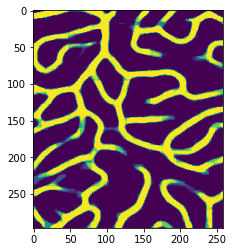

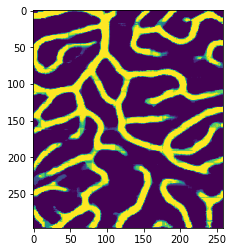

<Figure size 432x288 with 0 Axes>

In [89]:
unit_test(test_folder_list=test_folder_list,folder="..\\processed_all\\", phase="test", save_folder="..\\result\\model_4_28b\\")

In [8]:
test_folder_full(test_folder_list=test_folder_list,folder="..\\processed_all\\", phase="test", save_folder="..\\result\\model_4_30A\\")

GCL 7822 12 (75-89)
GCL 1733_12T2p5S (55-65)
GCL 1733_12T2p5I (65-75)
GCL 1733_3T2p5S (82-140)
GCL 4179 12S (64-69)
GCL 5341 12 (95-110)
GCL 9165_12T2p5I (84-97)
GCL 6289 3I (100-160)
GCL 6809 3I (126-168)
GCL 8851 1.5 (189-234)
GCL 9165_6T2p5I (119-159)
GCL 4179 12I (65-70)
GCL 4136_6T2p5S (115-165)
OPL 6809 6S (260-300)
OPL 6289 6I (270-310)
OPL 6809 12S (220-255)
OPL 4136_3T2p5S (300-330)
OPL 7822 1.5 (250-270)
OPL 6581 1.5 (188-205)
OPL 1541_6T2p5I (215-240)
OPL 6289 12I (185-220)
IPL 4179 3I (109-148)
IPL 1541_3T2p5S (188-230)
IPL 7822 12 (127-151)
IPL 1541_6T2p5I (130-168)
IPL 1733_3T2p5S (165-220)
IPL 6497 12I (87-110)
IPL 4179 12S (118-143)
IPL 4179 12I (124-142)
IPL 7365 3I (165-200)
IPL 6242 12I (140-185)
IPL 6809 12S (184-210)
IPL 7365 12I (91-119)
IPL 4136_6T2p5I (215-245)


<ipython-input-6-f6ee111717e2>:145: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axarr = plt.subplots(1,4,figsize=(20,10))


LSTM:
dice:  0.6784238263704431
precision:  0.6443358853477732
recall:  0.7689673127810313
accuracy:  0.9230399230399227
auc:  0.8650833094549162
Unet:
dice:  0.6835527649005492
precision:  0.6445744267290403
recall:  0.7794546164236548
accuracy:  0.9241128064657478
auc:  0.8704146503985
[0.7497014403343201, 0.6158760190010071, 0.5836149454116821, 0.5243225693702698, 0.6140614151954651, 0.7439024448394775, 0.7758724689483643, 0.7598392963409424, 0.6654108166694641, 0.7730839848518372, 0.7596665024757385, 0.7468344569206238, 0.7308579683303833, 0.8034688830375671, 0.7443413734436035, 0.717074990272522, 0.8163599967956543, 0.7157721519470215, 0.688946008682251, 0.8191916346549988, 0.7888038754463196, 0.6731614470481873, 0.0014830863801762462, 0.6732076406478882, 0.6422895193099976, 0.6832543611526489, 0.6032077670097351, 0.7181102633476257, 0.6505215764045715, 0.721550464630127, 0.7446303367614746, 0.5665378570556641, 0.6777802109718323, 0.7480562329292297] [0.6845303006698863, 0.6179688

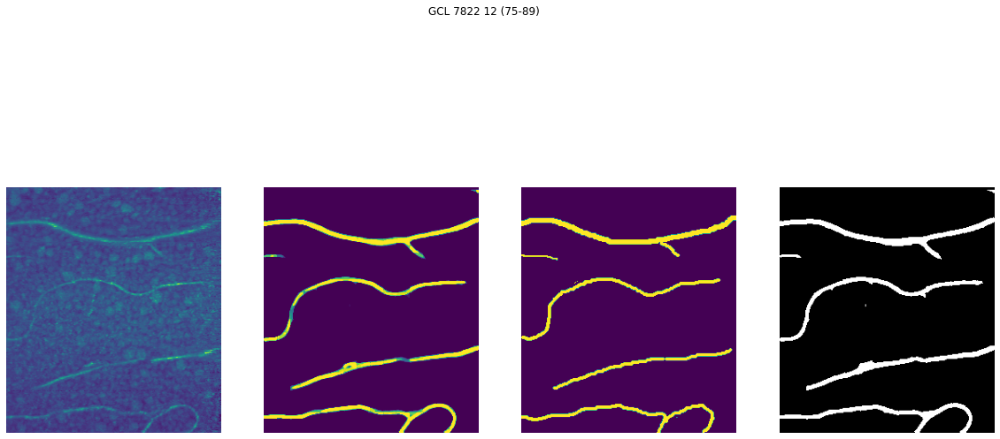

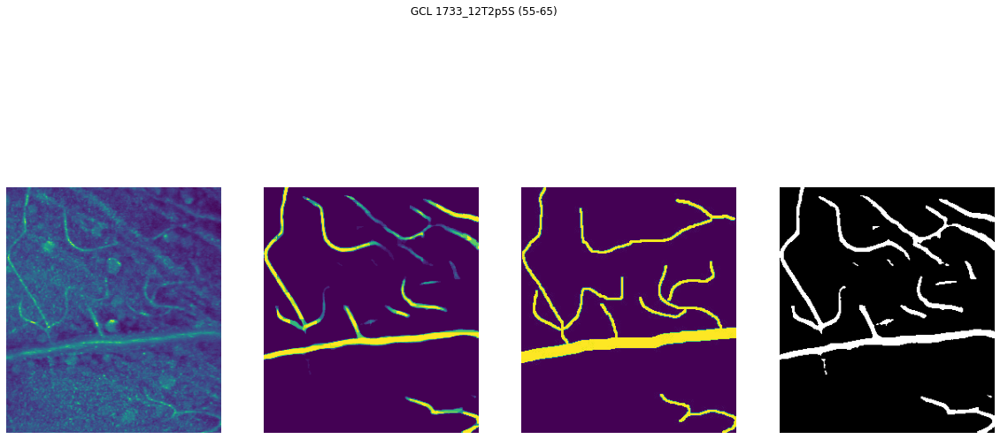

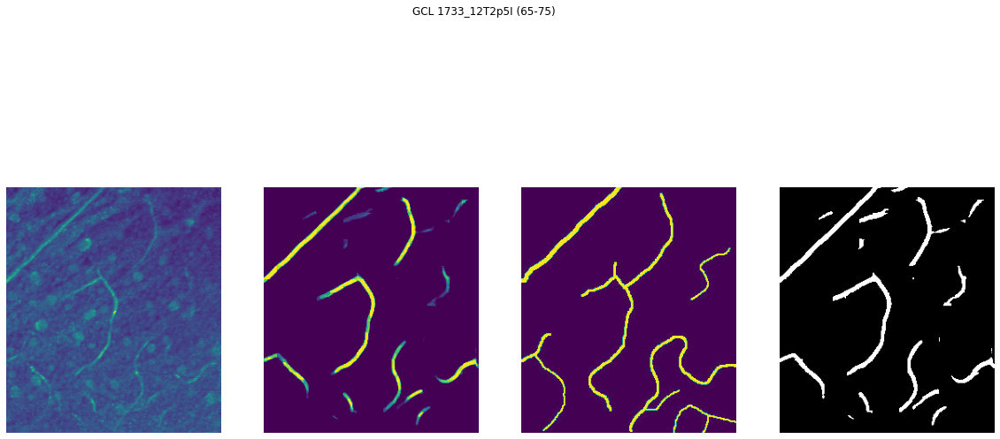

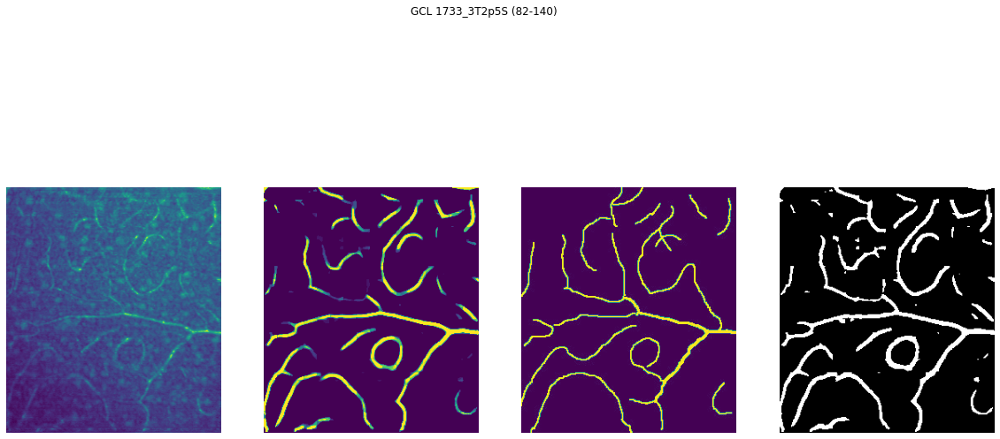

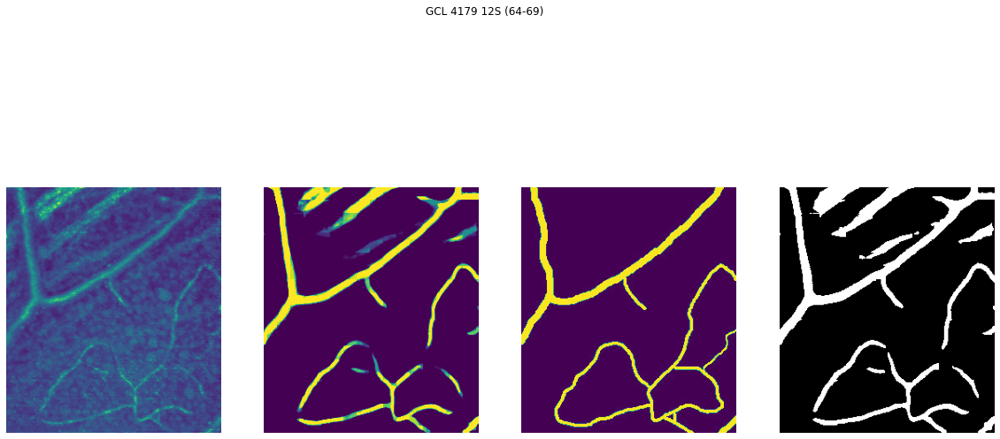

...

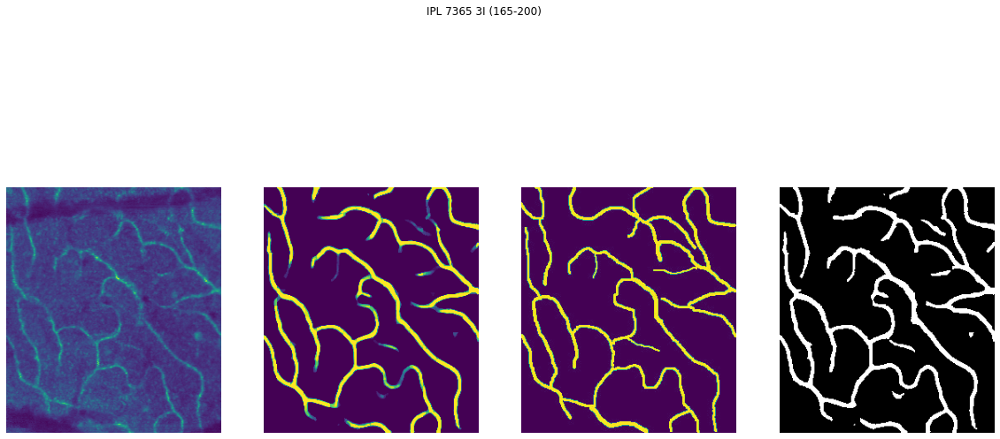

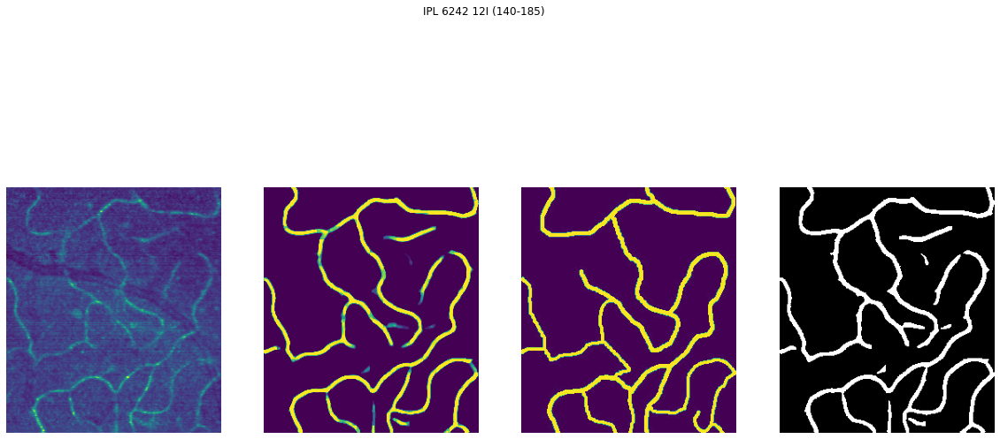

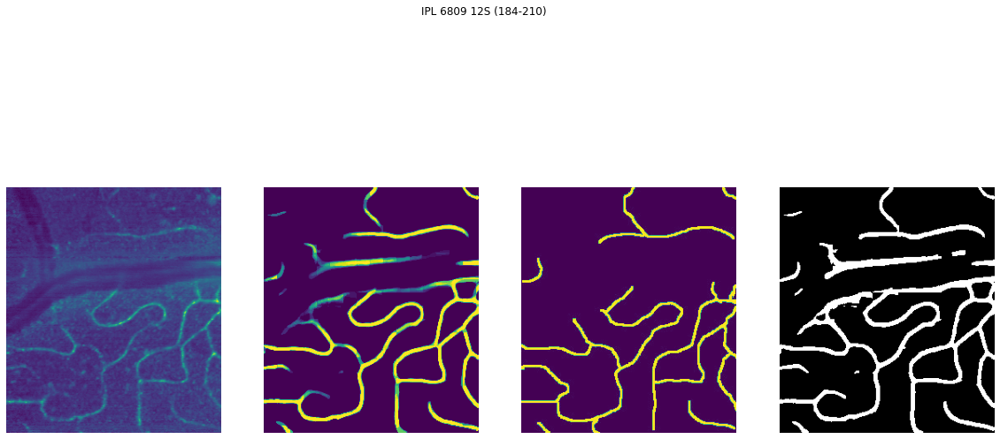

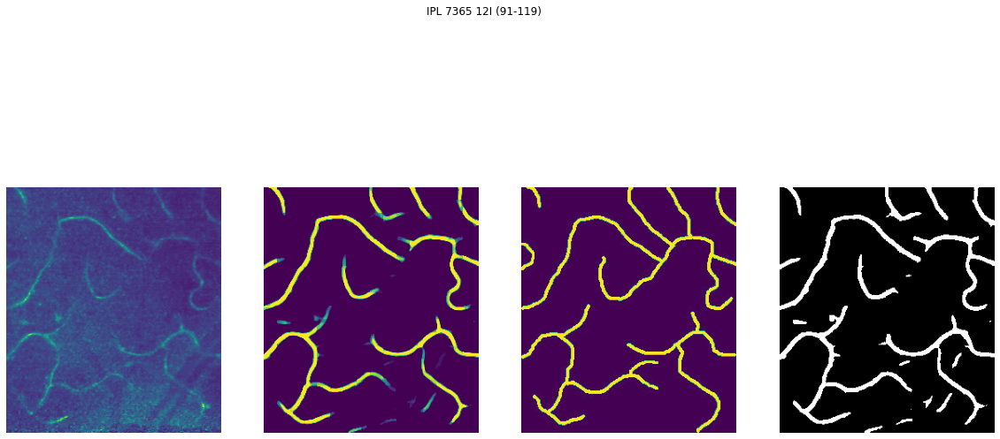

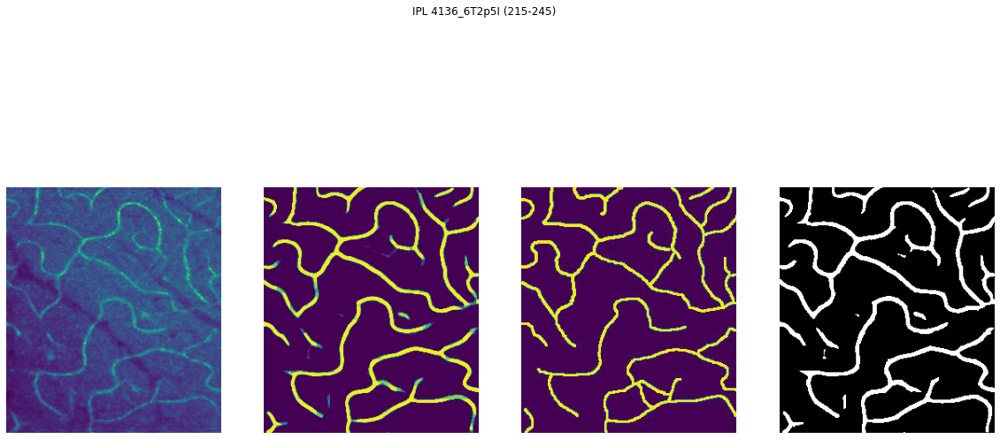

In [7]:
dice_out,prec_out,rec_out,acc_out,auc_out = disp_image(folder="..\\processed_all\\", phase="test",save_folder="..\\result\\model_4_30A\\")
print(dice_out,prec_out,rec_out,acc_out,auc_out)